<h1 ><big><center>MSO 3.4 - Deep Structured Learning</center></big></h1>

<h2><big><center> BE 2 - GANs and Diffusion </center></big></h2>

<h5><center>GANs section adapted from the <i>Projet d'Option</i> of : Mhamed Jabri, Martin Chauvin, Ahmed Sahraoui, Zakariae Moustaïne and Taoufik Bouchikhi  
<h5><center>Diffusion section implemented by Bruno Machado<br>


<p align="center">
<img height=300px src="https://cdn-images-1.medium.com/max/1080/0*tJRy5Chmk4XymxwN.png"/></p>
<p align="center"></p>

The aim of this assignment is to discover generative models for images, understand how they are implemented and then explore some specific architectures and training strategies which allows us to perform image generation with and without conditioning (the picture above exemplifies image generation conditioned by another image)

The deliverable for this assignment is this notebook, with the required modifications :
* In this notebook you'll find <font color='red'>**questions**</font>  that aim to test your understanding of the concepts studied. You should answer them by editing the Markdown cells (or adding new ones).
* In some of the code cells, you'll have to complete the code and you'll find a "TODO" explaining what you should implement.
* There are also some <font color='green'>**bonus**</font> exercises. Those exercises are **optional** and should be performed only **AFTER** all the rest of the assignment is complete.

# Part 1: DC-GAN

In this part, we aim to learn and understand the basic concepts of **Generative Adversarial Networks** through a DCGAN. For this purpose, please study the following tutorial: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html


We want to generate handwritten digits using the MNIST dataset. It is available within the torvision package (https://pytorch.org/vision/stable/generated/torchvision.datasets.MNIST.html#torchvision.datasets.MNIST)

Adapt the code given in the tutorial in order to use it with the MNIST dataset. Present the loss curves in function of the gradient steps for the generator and discriminator and also compare the generated images with the images from the dataset.

In [4]:
# TODO: adapt the code from the tutorial to experiment on the MNIST dataset

#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import numpy as np

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


In [5]:
# Root directory for dataset
dataroot = "data/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

if ngpu >= 1 and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = "cpu"

In [6]:
# Import required libraries
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader

# Download MNIST Dataset
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Download training data
train_dataset = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=False,
    transform=transform
)

# Download test data
test_dataset = torchvision.datasets.MNIST(
    root='./data',
    train=False,
    download=False,
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Training dataset size: 60000
Test dataset size: 10000
Image shape: torch.Size([1, 64, 64])
Number of classes: 10
Classes: ['0 - zero', '1 - one', '2 - two', '3 - three', '4 - four', '5 - five', '6 - six', '7 - seven', '8 - eight', '9 - nine']


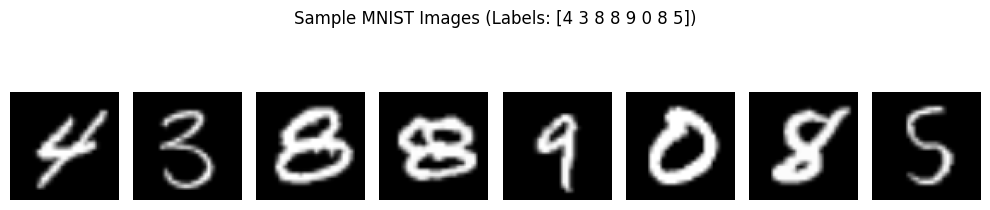

Min pixel value: -1.0
Max pixel value: 1.0


In [7]:
# Explore Dataset Structure
print(f"Training dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
print(f"Image shape: {train_dataset[0][0].shape}")
print(f"Number of classes: {len(train_dataset.classes)}")
print(f"Classes: {train_dataset.classes}")

# Visualize Sample Images
def show_images(images, title):
    fig, axes = plt.subplots(1, len(images), figsize=(10, 2.5))
    for i, img in enumerate(images):
        img = img.squeeze().numpy()  # Remove channel dimension and convert to numpy
        axes[i].imshow(img, cmap='gray')
        axes[i].axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Get some random training images
dataiter = iter(train_loader)
images, labels = next(dataiter)

# Denormalize images for visualization
images_viz = (images * 0.5 + 0.5)[:8]  # Display first 8 images
show_images(images_viz, f"Sample MNIST Images (Labels: {labels[:8].numpy()})")

# Check data range after normalization
print(f"Min pixel value: {images.min().item()}")
print(f"Max pixel value: {images.max().item()}")

In [8]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'mps') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'mps') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(train_loader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/5][0/469]	Loss_D: 1.9539	Loss_G: 4.3573	D(x): 0.5495	D(G(z)): 0.6393 / 0.0226
[0/5][50/469]	Loss_D: 0.0223	Loss_G: 9.0005	D(x): 0.9811	D(G(z)): 0.0002 / 0.0002
[0/5][100/469]	Loss_D: 0.1816	Loss_G: 9.4544	D(x): 0.8738	D(G(z)): 0.0017 / 0.0006
[0/5][150/469]	Loss_D: 0.2147	Loss_G: 6.1487	D(x): 0.9811	D(G(z)): 0.1524 / 0.0042
[0/5][200/469]	Loss_D: 0.3210	Loss_G: 4.3573	D(x): 0.9183	D(G(z)): 0.1783 / 0.0227
[0/5][250/469]	Loss_D: 0.2436	Loss_G: 3.6844	D(x): 0.8462	D(G(z)): 0.0429 / 0.0390
[0/5][300/469]	Loss_D: 0.1024	Loss_G: 4.1396	D(x): 0.9295	D(G(z)): 0.0255 / 0.0256
[0/5][350/469]	Loss_D: 0.2201	Loss_G: 2.9162	D(x): 0.8413	D(G(z)): 0.0272 / 0.0781
[0/5][400/469]	Loss_D: 1.0752	Loss_G: 3.4901	D(x): 0.8765	D(G(z)): 0.5491 / 0.0504
[0/5][450/469]	Loss_D: 0.2361	Loss_G: 2.2693	D(x): 0.8616	D(G(z)): 0.0701 / 0.1351
[1/5][0/469]	Loss_D: 0.1569	Loss_G: 3.2295	D(x): 0.9219	D(G(z)): 0.0665 / 0.0532
[1/5][50/469]	Loss_D: 0.1655	Loss_G: 3.3972	D(x): 0.9293	D(G(z)): 

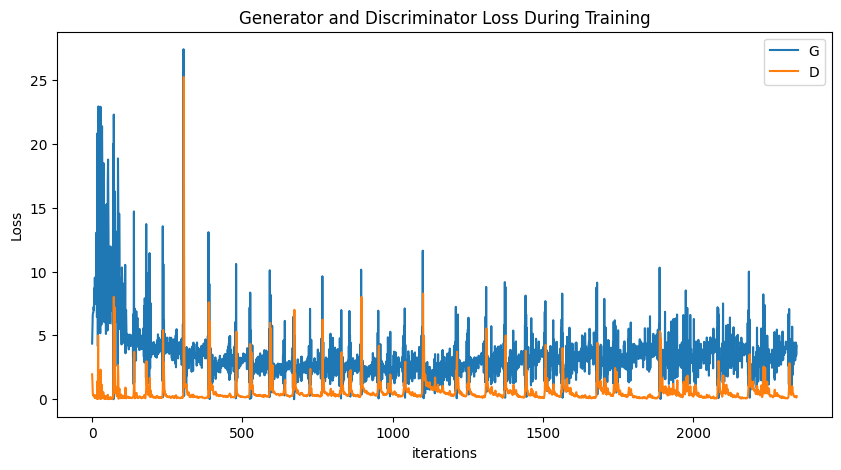

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

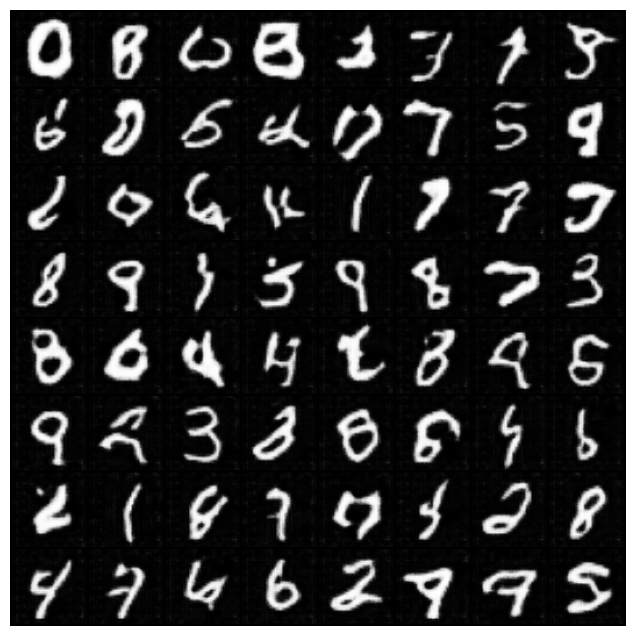

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

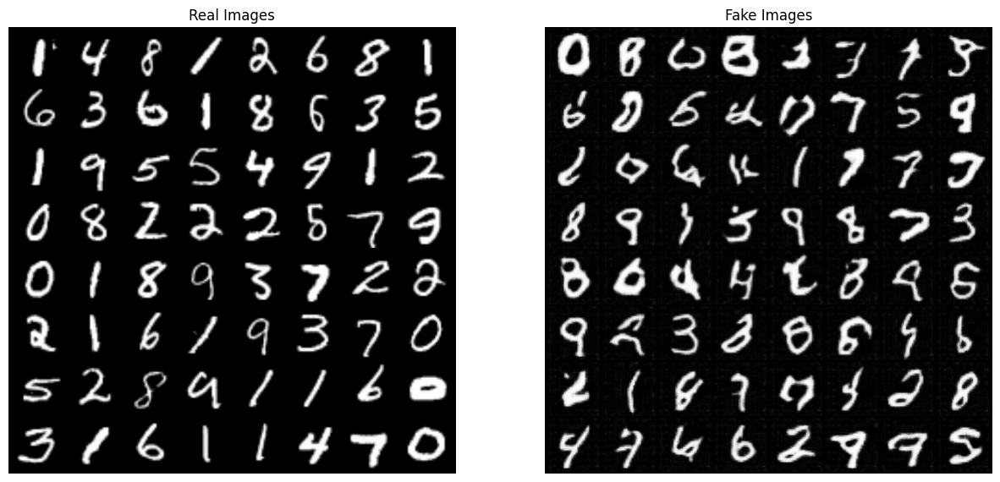

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

The results for some images might be convincing, but probably you can spot some bad results as well. We will see how we can use different architectures and training objectives to get better results. More importantly, we generate images directly from noise, not knowing what number (if any) will come out on the output.

<font color='red'>**Question**</font>  
How could we change the architecture above to control which number the generator should output ?

We can modify the GAN architecture by adding a one-hot encoded label vector representing the desired number to both the generator's input and the discriminator's input, creating a Conditional GAN (cGAN)

<font color='green'>**Bonus**</font>   
**Copy** the code you implemented above into a new Python cell and adapt it to implement your idea to control the number the generator outputs. Plot the training loss curves and a few examples of your model's outputs (e.g. generate(number=7) # Generates a handwritten 7). Note that we still want to be able to generate different images of the same class ! (i.e. generate(number=4) shoud not generate always the same handwritten 4, but a different one at each time)  

In [20]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [21]:
# Generator Code

embedding_size = 100

class GeneratorConditioned(nn.Module):
    def __init__(self, ngpu):
        super(GeneratorConditioned, self).__init__()
        self.ngpu = ngpu
        self.label_embedding = nn.Embedding(10, embedding_size)
        self.main = nn.Sequential(
            # input is Z + the size of label embedding, going into a convolution
            nn.ConvTranspose2d( nz + embedding_size, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            nn.Dropout(0.3),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.Dropout(0.3),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            nn.Dropout(0.3),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            nn.Dropout(0.3),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input, labels):
        # Concatenate the label embedding with the input
        c = self.label_embedding(labels).unsqueeze(2).unsqueeze(3)
        input = input.view(-1, nz, 1, 1)
        input = torch.cat((input, c), 1)
        # Pass through the main network
        return self.main(input)

In [22]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "mps" if torch.backends.mps.is_available() else "cpu")

# Create the generator
netG = GeneratorConditioned(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

GeneratorConditioned(
  (label_embedding): Embedding(10, 100)
  (main): Sequential(
    (0): ConvTranspose2d(200, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout(p=0.3, inplace=False)
    (4): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): Dropout(p=0.3, inplace=False)
    (8): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Dropout(p=0.3, inplace=False)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

In [23]:
import torch.nn.functional as F


class DiscriminatorConditioned(nn.Module):
    def __init__(self, ngpu):
        super(DiscriminatorConditioned, self).__init__()
        self.ngpu = ngpu
        self.label_embedding = nn.Embedding(10, embedding_size)
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc + embedding_size, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input, labels):
        batch_size, _, H, W = input.shape  # Get batch and image dimensions
        
        # Get label embedding and reshape
        c = self.label_embedding(labels).view(batch_size, embedding_size, 1, 1)  # (batch, embed_channels, 1, 1)
        c = F.interpolate(c, size=(H, W))  # Expand to match image size (H, W)
        input = torch.cat((input, c), 1)
        # Pass through the main network
        return self.main(input)

In [24]:
# Create the Discriminator
netD = DiscriminatorConditioned(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

DiscriminatorConditioned(
  (label_embedding): Embedding(10, 100)
  (main): Sequential(
    (0): Conv2d(101, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
   

In [25]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)
fixed_labels = torch.randint(0, 10, (64,), device=device)  # Random labels for fixed noise

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

Starting Training Loop...


1it [00:01,  1.13s/it]

[0/5][0/469]	Loss_D: 1.6573	Loss_G: 2.0957	D(x): 0.4400	D(G(z)): 0.4568 / 0.5387


11it [00:09,  1.26it/s]

[0/5][10/469]	Loss_D: 1.2085	Loss_G: 0.9780	D(x): 0.5519	D(G(z)): 0.4060 / 0.4248


21it [00:16,  1.27it/s]

[0/5][20/469]	Loss_D: 1.3867	Loss_G: 1.1295	D(x): 0.6627	D(G(z)): 0.5706 / 0.3613


31it [00:24,  1.30it/s]

[0/5][30/469]	Loss_D: 1.2827	Loss_G: 1.1208	D(x): 0.6974	D(G(z)): 0.5824 / 0.3690


41it [00:32,  1.31it/s]

[0/5][40/469]	Loss_D: 1.2754	Loss_G: 1.7002	D(x): 0.6866	D(G(z)): 0.5515 / 0.2135


51it [00:40,  1.30it/s]

[0/5][50/469]	Loss_D: 1.7216	Loss_G: 0.8375	D(x): 0.5405	D(G(z)): 0.5698 / 0.4803


61it [00:48,  1.28it/s]

[0/5][60/469]	Loss_D: 1.2669	Loss_G: 1.0987	D(x): 0.6512	D(G(z)): 0.5388 / 0.3471


71it [00:55,  1.27it/s]

[0/5][70/469]	Loss_D: 1.6444	Loss_G: 0.7581	D(x): 0.3728	D(G(z)): 0.4015 / 0.5392


81it [01:03,  1.27it/s]

[0/5][80/469]	Loss_D: 1.2848	Loss_G: 1.4370	D(x): 0.7033	D(G(z)): 0.5887 / 0.2447


91it [01:11,  1.26it/s]

[0/5][90/469]	Loss_D: 2.0377	Loss_G: 0.5205	D(x): 0.1983	D(G(z)): 0.2813 / 0.6114


101it [01:19,  1.26it/s]

[0/5][100/469]	Loss_D: 1.3880	Loss_G: 0.7856	D(x): 0.5565	D(G(z)): 0.5336 / 0.4657


111it [01:27,  1.29it/s]

[0/5][110/469]	Loss_D: 1.4265	Loss_G: 0.9248	D(x): 0.5061	D(G(z)): 0.5103 / 0.4073


121it [01:35,  1.26it/s]

[0/5][120/469]	Loss_D: 1.3756	Loss_G: 0.9058	D(x): 0.5102	D(G(z)): 0.4965 / 0.4115


131it [01:43,  1.24it/s]

[0/5][130/469]	Loss_D: 1.1112	Loss_G: 1.0089	D(x): 0.5540	D(G(z)): 0.3689 / 0.3862


141it [01:51,  1.23it/s]

[0/5][140/469]	Loss_D: 0.9757	Loss_G: 1.4931	D(x): 0.7704	D(G(z)): 0.4985 / 0.2352


151it [01:59,  1.23it/s]

[0/5][150/469]	Loss_D: 0.9798	Loss_G: 0.9990	D(x): 0.6331	D(G(z)): 0.3944 / 0.3750


161it [02:07,  1.22it/s]

[0/5][160/469]	Loss_D: 1.0724	Loss_G: 0.9033	D(x): 0.4534	D(G(z)): 0.2155 / 0.4163


171it [02:16,  1.23it/s]

[0/5][170/469]	Loss_D: 1.4830	Loss_G: 0.9908	D(x): 0.3700	D(G(z)): 0.3380 / 0.3945


181it [02:24,  1.18it/s]

[0/5][180/469]	Loss_D: 1.3195	Loss_G: 0.6150	D(x): 0.5746	D(G(z)): 0.5127 / 0.5500


191it [02:32,  1.21it/s]

[0/5][190/469]	Loss_D: 1.1525	Loss_G: 1.0012	D(x): 0.4921	D(G(z)): 0.3405 / 0.3731


201it [02:41,  1.21it/s]

[0/5][200/469]	Loss_D: 0.8570	Loss_G: 1.5558	D(x): 0.6627	D(G(z)): 0.3389 / 0.2172


211it [02:49,  1.19it/s]

[0/5][210/469]	Loss_D: 2.1705	Loss_G: 0.6113	D(x): 0.2080	D(G(z)): 0.4217 / 0.5498


221it [02:57,  1.19it/s]

[0/5][220/469]	Loss_D: 0.8659	Loss_G: 1.2117	D(x): 0.6882	D(G(z)): 0.3853 / 0.3016


231it [03:06,  1.20it/s]

[0/5][230/469]	Loss_D: 1.1910	Loss_G: 0.7608	D(x): 0.5136	D(G(z)): 0.3996 / 0.4706


241it [03:14,  1.19it/s]

[0/5][240/469]	Loss_D: 1.2256	Loss_G: 0.8143	D(x): 0.5435	D(G(z)): 0.4486 / 0.4526


251it [03:23,  1.19it/s]

[0/5][250/469]	Loss_D: 1.4961	Loss_G: 0.7606	D(x): 0.4335	D(G(z)): 0.4764 / 0.4693


261it [03:31,  1.19it/s]

[0/5][260/469]	Loss_D: 1.6249	Loss_G: 0.7997	D(x): 0.5198	D(G(z)): 0.6172 / 0.4552


271it [03:40,  1.18it/s]

[0/5][270/469]	Loss_D: 1.1370	Loss_G: 1.0084	D(x): 0.4501	D(G(z)): 0.2752 / 0.3731


281it [03:48,  1.17it/s]

[0/5][280/469]	Loss_D: 1.9423	Loss_G: 0.5761	D(x): 0.4210	D(G(z)): 0.6015 / 0.5732


291it [03:57,  1.15it/s]

[0/5][290/469]	Loss_D: 1.2072	Loss_G: 0.8281	D(x): 0.5745	D(G(z)): 0.4774 / 0.4379


301it [04:06,  1.11it/s]

[0/5][300/469]	Loss_D: 1.1206	Loss_G: 0.9815	D(x): 0.5183	D(G(z)): 0.3609 / 0.3759


311it [04:15,  1.05it/s]

[0/5][310/469]	Loss_D: 1.4306	Loss_G: 0.6545	D(x): 0.4257	D(G(z)): 0.4317 / 0.5213


321it [04:25,  1.02it/s]

[0/5][320/469]	Loss_D: 1.3911	Loss_G: 0.6744	D(x): 0.6061	D(G(z)): 0.5768 / 0.5127


331it [04:35,  1.03it/s]

[0/5][330/469]	Loss_D: 1.5743	Loss_G: 0.7372	D(x): 0.5449	D(G(z)): 0.6105 / 0.4819


341it [04:45,  1.03it/s]

[0/5][340/469]	Loss_D: 1.1492	Loss_G: 0.9337	D(x): 0.4664	D(G(z)): 0.3005 / 0.4008


351it [04:54,  1.05it/s]

[0/5][350/469]	Loss_D: 1.5235	Loss_G: 0.9812	D(x): 0.2775	D(G(z)): 0.2081 / 0.3898


361it [05:04,  1.08it/s]

[0/5][360/469]	Loss_D: 1.3732	Loss_G: 0.7357	D(x): 0.6502	D(G(z)): 0.6034 / 0.4845


371it [05:13,  1.07it/s]

[0/5][370/469]	Loss_D: 0.8176	Loss_G: 1.2102	D(x): 0.6413	D(G(z)): 0.3099 / 0.3013


381it [05:22,  1.08it/s]

[0/5][380/469]	Loss_D: 1.6498	Loss_G: 0.8380	D(x): 0.5829	D(G(z)): 0.6530 / 0.4399


391it [05:31,  1.08it/s]

[0/5][390/469]	Loss_D: 1.3087	Loss_G: 0.7342	D(x): 0.5067	D(G(z)): 0.4606 / 0.4820


401it [05:41,  1.08it/s]

[0/5][400/469]	Loss_D: 1.4015	Loss_G: 0.7603	D(x): 0.4106	D(G(z)): 0.3824 / 0.4716


411it [05:50,  1.09it/s]

[0/5][410/469]	Loss_D: 1.2229	Loss_G: 0.8708	D(x): 0.4669	D(G(z)): 0.3542 / 0.4236


421it [05:59,  1.07it/s]

[0/5][420/469]	Loss_D: 1.3697	Loss_G: 0.6980	D(x): 0.5207	D(G(z)): 0.5057 / 0.4997


431it [06:09,  1.06it/s]

[0/5][430/469]	Loss_D: 1.5245	Loss_G: 0.6745	D(x): 0.5714	D(G(z)): 0.6098 / 0.5111


441it [06:18,  1.06it/s]

[0/5][440/469]	Loss_D: 0.7637	Loss_G: 1.3186	D(x): 0.5946	D(G(z)): 0.2062 / 0.2776


451it [06:28,  1.05it/s]

[0/5][450/469]	Loss_D: 1.2115	Loss_G: 0.9818	D(x): 0.6307	D(G(z)): 0.5198 / 0.3791


461it [06:37,  1.06it/s]

[0/5][460/469]	Loss_D: 1.2783	Loss_G: 0.7646	D(x): 0.5289	D(G(z)): 0.4696 / 0.4678


469it [06:45,  1.16it/s]
1it [00:01,  1.08s/it]

[1/5][0/469]	Loss_D: 1.0944	Loss_G: 0.8783	D(x): 0.6537	D(G(z)): 0.4858 / 0.4165


11it [00:10,  1.05it/s]

[1/5][10/469]	Loss_D: 1.1859	Loss_G: 1.0739	D(x): 0.4272	D(G(z)): 0.2788 / 0.3502


21it [00:20,  1.06it/s]

[1/5][20/469]	Loss_D: 1.4671	Loss_G: 0.7906	D(x): 0.3192	D(G(z)): 0.2527 / 0.4667


31it [00:29,  1.04it/s]

[1/5][30/469]	Loss_D: 1.5231	Loss_G: 0.6225	D(x): 0.4002	D(G(z)): 0.4503 / 0.5402


41it [00:39,  1.04it/s]

[1/5][40/469]	Loss_D: 1.4839	Loss_G: 0.7806	D(x): 0.5452	D(G(z)): 0.5676 / 0.4608


51it [00:49,  1.01s/it]

[1/5][50/469]	Loss_D: 1.2118	Loss_G: 0.8802	D(x): 0.7407	D(G(z)): 0.5835 / 0.4185


61it [00:58,  1.05it/s]

[1/5][60/469]	Loss_D: 1.2090	Loss_G: 0.9058	D(x): 0.5550	D(G(z)): 0.4592 / 0.4052


71it [01:08,  1.04it/s]

[1/5][70/469]	Loss_D: 1.3510	Loss_G: 0.8203	D(x): 0.6488	D(G(z)): 0.5837 / 0.4441


81it [01:17,  1.04it/s]

[1/5][80/469]	Loss_D: 0.9986	Loss_G: 1.0824	D(x): 0.5646	D(G(z)): 0.3411 / 0.3439


91it [01:27,  1.05it/s]

[1/5][90/469]	Loss_D: 1.2894	Loss_G: 0.7554	D(x): 0.4726	D(G(z)): 0.4075 / 0.4742


101it [01:36,  1.03it/s]

[1/5][100/469]	Loss_D: 1.4960	Loss_G: 0.5834	D(x): 0.6214	D(G(z)): 0.6379 / 0.5643


111it [01:46,  1.05it/s]

[1/5][110/469]	Loss_D: 1.7816	Loss_G: 0.5693	D(x): 0.5597	D(G(z)): 0.6978 / 0.5708


121it [01:56,  1.04it/s]

[1/5][120/469]	Loss_D: 1.1244	Loss_G: 0.8623	D(x): 0.5285	D(G(z)): 0.3845 / 0.4230


131it [02:05,  1.05it/s]

[1/5][130/469]	Loss_D: 1.8270	Loss_G: 0.7727	D(x): 0.2451	D(G(z)): 0.3207 / 0.4673


141it [02:15,  1.03it/s]

[1/5][140/469]	Loss_D: 1.1704	Loss_G: 0.8418	D(x): 0.7002	D(G(z)): 0.5483 / 0.4442


151it [02:25,  1.03it/s]

[1/5][150/469]	Loss_D: 1.3382	Loss_G: 0.6978	D(x): 0.6600	D(G(z)): 0.6002 / 0.4982


161it [02:34,  1.03it/s]

[1/5][160/469]	Loss_D: 1.1295	Loss_G: 0.8015	D(x): 0.5742	D(G(z)): 0.4339 / 0.4511


171it [02:44,  1.04it/s]

[1/5][170/469]	Loss_D: 1.4168	Loss_G: 0.5796	D(x): 0.6749	D(G(z)): 0.6304 / 0.5615


181it [02:54,  1.04it/s]

[1/5][180/469]	Loss_D: 1.5814	Loss_G: 0.8179	D(x): 0.3121	D(G(z)): 0.3309 / 0.4453


191it [03:03,  1.04it/s]

[1/5][190/469]	Loss_D: 0.8533	Loss_G: 1.0309	D(x): 0.6635	D(G(z)): 0.3471 / 0.3572


201it [03:13,  1.04it/s]

[1/5][200/469]	Loss_D: 0.8550	Loss_G: 1.0136	D(x): 0.6592	D(G(z)): 0.3534 / 0.3657


211it [03:23,  1.02it/s]

[1/5][210/469]	Loss_D: 1.4106	Loss_G: 0.6808	D(x): 0.6586	D(G(z)): 0.6024 / 0.5140


221it [03:33,  1.03it/s]

[1/5][220/469]	Loss_D: 1.4343	Loss_G: 0.6737	D(x): 0.5081	D(G(z)): 0.5273 / 0.5101


231it [03:42,  1.02it/s]

[1/5][230/469]	Loss_D: 1.5622	Loss_G: 0.6723	D(x): 0.3280	D(G(z)): 0.3579 / 0.5153


241it [03:52,  1.04it/s]

[1/5][240/469]	Loss_D: 1.6253	Loss_G: 0.6925	D(x): 0.2968	D(G(z)): 0.3246 / 0.5021


251it [04:02,  1.01it/s]

[1/5][250/469]	Loss_D: 1.3182	Loss_G: 0.7083	D(x): 0.5664	D(G(z)): 0.5174 / 0.4957


261it [04:12,  1.02it/s]

[1/5][260/469]	Loss_D: 1.7951	Loss_G: 0.4556	D(x): 0.3986	D(G(z)): 0.5826 / 0.6369


271it [04:21,  1.02it/s]

[1/5][270/469]	Loss_D: 1.2178	Loss_G: 0.9547	D(x): 0.7595	D(G(z)): 0.6001 / 0.3984


281it [04:31,  1.02it/s]

[1/5][280/469]	Loss_D: 1.0135	Loss_G: 0.8273	D(x): 0.6615	D(G(z)): 0.4285 / 0.4617


291it [04:41,  1.02it/s]

[1/5][290/469]	Loss_D: 0.8393	Loss_G: 1.2151	D(x): 0.5714	D(G(z)): 0.2362 / 0.2988


301it [04:51,  1.02it/s]

[1/5][300/469]	Loss_D: 1.2606	Loss_G: 1.0317	D(x): 0.6165	D(G(z)): 0.5216 / 0.3608


311it [05:01,  1.01it/s]

[1/5][310/469]	Loss_D: 1.1766	Loss_G: 0.9117	D(x): 0.4832	D(G(z)): 0.3481 / 0.4063


321it [05:11,  1.03it/s]

[1/5][320/469]	Loss_D: 1.9951	Loss_G: 0.4346	D(x): 0.6443	D(G(z)): 0.7837 / 0.6600


331it [05:20,  1.02it/s]

[1/5][330/469]	Loss_D: 1.0253	Loss_G: 1.0240	D(x): 0.5460	D(G(z)): 0.3289 / 0.3619


341it [05:30,  1.02it/s]

[1/5][340/469]	Loss_D: 1.0767	Loss_G: 0.9422	D(x): 0.5582	D(G(z)): 0.3612 / 0.3943


351it [05:40,  1.01it/s]

[1/5][350/469]	Loss_D: 1.3029	Loss_G: 0.6875	D(x): 0.6450	D(G(z)): 0.5751 / 0.5033


361it [05:50,  1.01s/it]

[1/5][360/469]	Loss_D: 1.1221	Loss_G: 0.9205	D(x): 0.5413	D(G(z)): 0.3880 / 0.3998


371it [06:00,  1.00it/s]

[1/5][370/469]	Loss_D: 1.6534	Loss_G: 0.5038	D(x): 0.6205	D(G(z)): 0.6869 / 0.6071


381it [06:10,  1.01it/s]

[1/5][380/469]	Loss_D: 1.4412	Loss_G: 0.8154	D(x): 0.4358	D(G(z)): 0.4384 / 0.4477


391it [06:20,  1.01it/s]

[1/5][390/469]	Loss_D: 2.0407	Loss_G: 0.8113	D(x): 0.1750	D(G(z)): 0.2537 / 0.4583


401it [06:30,  1.00s/it]

[1/5][400/469]	Loss_D: 1.3114	Loss_G: 0.6844	D(x): 0.5546	D(G(z)): 0.5136 / 0.5048


411it [06:40,  1.00it/s]

[1/5][410/469]	Loss_D: 1.4007	Loss_G: 0.6428	D(x): 0.5564	D(G(z)): 0.5546 / 0.5269


421it [06:50,  1.01it/s]

[1/5][420/469]	Loss_D: 1.2975	Loss_G: 0.8419	D(x): 0.6365	D(G(z)): 0.5699 / 0.4341


431it [07:00,  1.01it/s]

[1/5][430/469]	Loss_D: 1.8282	Loss_G: 0.4960	D(x): 0.4720	D(G(z)): 0.6543 / 0.6105


441it [07:10,  1.01it/s]

[1/5][440/469]	Loss_D: 1.0601	Loss_G: 0.8522	D(x): 0.7389	D(G(z)): 0.5220 / 0.4295


451it [07:20,  1.01it/s]

[1/5][450/469]	Loss_D: 1.0994	Loss_G: 0.9871	D(x): 0.5182	D(G(z)): 0.3555 / 0.3744


461it [07:30,  1.00s/it]

[1/5][460/469]	Loss_D: 1.1706	Loss_G: 0.7170	D(x): 0.6926	D(G(z)): 0.5511 / 0.4884


469it [07:38,  1.02it/s]
1it [00:01,  1.15s/it]

[2/5][0/469]	Loss_D: 1.2714	Loss_G: 0.7889	D(x): 0.4538	D(G(z)): 0.3801 / 0.4556


11it [00:11,  1.01s/it]

[2/5][10/469]	Loss_D: 0.9187	Loss_G: 0.9404	D(x): 0.6806	D(G(z)): 0.4114 / 0.3907


21it [00:21,  1.01it/s]

[2/5][20/469]	Loss_D: 1.6702	Loss_G: 0.5403	D(x): 0.5347	D(G(z)): 0.6457 / 0.5862


31it [00:31,  1.00it/s]

[2/5][30/469]	Loss_D: 1.3447	Loss_G: 0.6865	D(x): 0.5646	D(G(z)): 0.5331 / 0.5059


41it [00:41,  1.01it/s]

[2/5][40/469]	Loss_D: 1.6012	Loss_G: 0.6445	D(x): 0.3628	D(G(z)): 0.4420 / 0.5279


51it [00:50,  1.00s/it]

[2/5][50/469]	Loss_D: 1.6519	Loss_G: 0.6662	D(x): 0.3722	D(G(z)): 0.4825 / 0.5175


61it [01:00,  1.00it/s]

[2/5][60/469]	Loss_D: 1.4387	Loss_G: 0.6503	D(x): 0.5072	D(G(z)): 0.5312 / 0.5224


71it [01:11,  1.00s/it]

[2/5][70/469]	Loss_D: 1.2227	Loss_G: 0.9903	D(x): 0.4407	D(G(z)): 0.3242 / 0.3747


81it [01:21,  1.00s/it]

[2/5][80/469]	Loss_D: 1.1060	Loss_G: 1.1015	D(x): 0.4566	D(G(z)): 0.2724 / 0.3414


91it [01:31,  1.01s/it]

[2/5][90/469]	Loss_D: 1.1162	Loss_G: 0.8548	D(x): 0.4952	D(G(z)): 0.3333 / 0.4286


101it [01:41,  1.01it/s]

[2/5][100/469]	Loss_D: 0.9056	Loss_G: 0.9601	D(x): 0.6813	D(G(z)): 0.4009 / 0.3844


111it [01:51,  1.01s/it]

[2/5][110/469]	Loss_D: 1.0950	Loss_G: 0.8566	D(x): 0.4964	D(G(z)): 0.3201 / 0.4306


121it [02:01,  1.00s/it]

[2/5][120/469]	Loss_D: 1.0887	Loss_G: 0.9912	D(x): 0.5276	D(G(z)): 0.3614 / 0.3735


131it [02:11,  1.01s/it]

[2/5][130/469]	Loss_D: 1.0975	Loss_G: 0.7845	D(x): 0.6172	D(G(z)): 0.4535 / 0.4569


141it [02:21,  1.01it/s]

[2/5][140/469]	Loss_D: 1.5577	Loss_G: 0.7233	D(x): 0.4700	D(G(z)): 0.5450 / 0.4863


151it [02:31,  1.00it/s]

[2/5][150/469]	Loss_D: 1.0761	Loss_G: 0.8545	D(x): 0.6185	D(G(z)): 0.4465 / 0.4256


161it [02:41,  1.00s/it]

[2/5][160/469]	Loss_D: 1.1157	Loss_G: 0.9377	D(x): 0.6711	D(G(z)): 0.5091 / 0.3922


171it [02:51,  1.01it/s]

[2/5][170/469]	Loss_D: 2.0146	Loss_G: 0.4005	D(x): 0.5793	D(G(z)): 0.7612 / 0.6816


181it [03:01,  1.02s/it]

[2/5][180/469]	Loss_D: 1.5581	Loss_G: 0.7102	D(x): 0.4954	D(G(z)): 0.5501 / 0.4935


191it [03:11,  1.01s/it]

[2/5][190/469]	Loss_D: 2.2911	Loss_G: 0.4086	D(x): 0.5247	D(G(z)): 0.7995 / 0.6722


201it [03:21,  1.01s/it]

[2/5][200/469]	Loss_D: 1.6267	Loss_G: 1.1398	D(x): 0.2559	D(G(z)): 0.1917 / 0.3373


211it [03:31,  1.01s/it]

[2/5][210/469]	Loss_D: 0.8410	Loss_G: 1.0062	D(x): 0.6498	D(G(z)): 0.3353 / 0.3667


221it [03:42,  1.01s/it]

[2/5][220/469]	Loss_D: 1.5486	Loss_G: 0.5903	D(x): 0.5527	D(G(z)): 0.6136 / 0.5565


231it [03:52,  1.00s/it]

[2/5][230/469]	Loss_D: 1.1176	Loss_G: 0.8598	D(x): 0.6680	D(G(z)): 0.4908 / 0.4267


241it [04:02,  1.01s/it]

[2/5][240/469]	Loss_D: 0.7879	Loss_G: 1.5411	D(x): 0.5808	D(G(z)): 0.2149 / 0.2236


251it [04:12,  1.01s/it]

[2/5][250/469]	Loss_D: 1.5649	Loss_G: 1.1385	D(x): 0.2792	D(G(z)): 0.2225 / 0.3315


261it [04:22,  1.02s/it]

[2/5][260/469]	Loss_D: 0.7060	Loss_G: 1.0547	D(x): 0.7648	D(G(z)): 0.3536 / 0.3499


271it [04:32,  1.01s/it]

[2/5][270/469]	Loss_D: 1.8565	Loss_G: 0.6212	D(x): 0.3054	D(G(z)): 0.4826 / 0.5381


281it [04:42,  1.03s/it]

[2/5][280/469]	Loss_D: 1.8123	Loss_G: 0.6517	D(x): 0.3783	D(G(z)): 0.5538 / 0.5216


291it [04:52,  1.02s/it]

[2/5][290/469]	Loss_D: 1.2485	Loss_G: 1.0274	D(x): 0.4967	D(G(z)): 0.3680 / 0.3649


301it [05:03,  1.03s/it]

[2/5][300/469]	Loss_D: 1.2977	Loss_G: 0.7135	D(x): 0.5729	D(G(z)): 0.5167 / 0.4934


311it [05:13,  1.04s/it]

[2/5][310/469]	Loss_D: 0.8932	Loss_G: 1.3063	D(x): 0.5341	D(G(z)): 0.2294 / 0.2769


321it [05:23,  1.02s/it]

[2/5][320/469]	Loss_D: 1.4534	Loss_G: 0.9017	D(x): 0.4222	D(G(z)): 0.4302 / 0.4116


331it [05:34,  1.01s/it]

[2/5][330/469]	Loss_D: 1.1238	Loss_G: 0.7739	D(x): 0.6500	D(G(z)): 0.4907 / 0.4625


341it [05:44,  1.02s/it]

[2/5][340/469]	Loss_D: 1.0937	Loss_G: 0.9742	D(x): 0.5306	D(G(z)): 0.3634 / 0.3776


351it [05:54,  1.02s/it]

[2/5][350/469]	Loss_D: 1.7184	Loss_G: 0.5422	D(x): 0.4199	D(G(z)): 0.5686 / 0.5830


361it [06:04,  1.02s/it]

[2/5][360/469]	Loss_D: 1.6075	Loss_G: 0.8704	D(x): 0.2774	D(G(z)): 0.2722 / 0.4218


371it [06:14,  1.02s/it]

[2/5][370/469]	Loss_D: 1.0541	Loss_G: 1.1698	D(x): 0.4999	D(G(z)): 0.2872 / 0.3153


381it [06:24,  1.01s/it]

[2/5][380/469]	Loss_D: 1.4054	Loss_G: 0.6799	D(x): 0.5783	D(G(z)): 0.5739 / 0.5090


391it [06:35,  1.01s/it]

[2/5][390/469]	Loss_D: 1.3162	Loss_G: 0.7445	D(x): 0.5079	D(G(z)): 0.4690 / 0.4752


401it [06:45,  1.02s/it]

[2/5][400/469]	Loss_D: 1.1058	Loss_G: 0.8047	D(x): 0.5793	D(G(z)): 0.4221 / 0.4492


411it [06:55,  1.02s/it]

[2/5][410/469]	Loss_D: 1.2526	Loss_G: 0.7536	D(x): 0.5344	D(G(z)): 0.4599 / 0.4718


421it [07:05,  1.02s/it]

[2/5][420/469]	Loss_D: 1.3046	Loss_G: 0.7687	D(x): 0.5648	D(G(z)): 0.5132 / 0.4646


431it [07:15,  1.03s/it]

[2/5][430/469]	Loss_D: 1.2051	Loss_G: 0.8332	D(x): 0.5591	D(G(z)): 0.4554 / 0.4368


441it [07:26,  1.03s/it]

[2/5][440/469]	Loss_D: 1.6235	Loss_G: 0.6735	D(x): 0.3737	D(G(z)): 0.4617 / 0.5127


451it [07:36,  1.03s/it]

[2/5][450/469]	Loss_D: 1.5660	Loss_G: 0.6117	D(x): 0.5115	D(G(z)): 0.5907 / 0.5437


461it [07:46,  1.02s/it]

[2/5][460/469]	Loss_D: 1.5395	Loss_G: 0.6338	D(x): 0.3954	D(G(z)): 0.4403 / 0.5331


469it [07:54,  1.01s/it]
1it [00:01,  1.07s/it]

[3/5][0/469]	Loss_D: 1.1973	Loss_G: 0.7742	D(x): 0.7754	D(G(z)): 0.6087 / 0.4716


11it [00:11,  1.02s/it]

[3/5][10/469]	Loss_D: 1.7355	Loss_G: 0.5306	D(x): 0.5694	D(G(z)): 0.6844 / 0.5940


21it [00:21,  1.02s/it]

[3/5][20/469]	Loss_D: 1.0058	Loss_G: 0.8838	D(x): 0.5456	D(G(z)): 0.3265 / 0.4167


31it [00:31,  1.02s/it]

[3/5][30/469]	Loss_D: 1.2562	Loss_G: 0.8269	D(x): 0.4898	D(G(z)): 0.4143 / 0.4403


41it [00:41,  1.02s/it]

[3/5][40/469]	Loss_D: 1.7730	Loss_G: 0.5597	D(x): 0.3517	D(G(z)): 0.5161 / 0.5724


51it [00:52,  1.02s/it]

[3/5][50/469]	Loss_D: 0.7722	Loss_G: 1.0694	D(x): 0.6798	D(G(z)): 0.3199 / 0.3457


61it [01:02,  1.04s/it]

[3/5][60/469]	Loss_D: 1.2558	Loss_G: 0.8017	D(x): 0.6485	D(G(z)): 0.5603 / 0.4513


71it [01:12,  1.02s/it]

[3/5][70/469]	Loss_D: 0.7882	Loss_G: 1.1195	D(x): 0.7710	D(G(z)): 0.4096 / 0.3293


81it [01:22,  1.02s/it]

[3/5][80/469]	Loss_D: 1.4286	Loss_G: 0.8873	D(x): 0.3429	D(G(z)): 0.2881 / 0.4149


91it [01:33,  1.05s/it]

[3/5][90/469]	Loss_D: 1.2312	Loss_G: 0.7556	D(x): 0.7364	D(G(z)): 0.6019 / 0.4792


101it [01:43,  1.03s/it]

[3/5][100/469]	Loss_D: 2.0504	Loss_G: 0.5428	D(x): 0.7470	D(G(z)): 0.8257 / 0.6017


111it [01:53,  1.02s/it]

[3/5][110/469]	Loss_D: 1.3881	Loss_G: 0.8109	D(x): 0.6122	D(G(z)): 0.5772 / 0.4489


121it [02:04,  1.03s/it]

[3/5][120/469]	Loss_D: 1.8104	Loss_G: 0.6166	D(x): 0.4696	D(G(z)): 0.6427 / 0.5428


131it [02:14,  1.02s/it]

[3/5][130/469]	Loss_D: 1.9218	Loss_G: 0.7121	D(x): 0.5916	D(G(z)): 0.7276 / 0.5063


141it [02:24,  1.02s/it]

[3/5][140/469]	Loss_D: 1.4397	Loss_G: 0.6993	D(x): 0.5220	D(G(z)): 0.5348 / 0.5029


151it [02:35,  1.02s/it]

[3/5][150/469]	Loss_D: 0.9197	Loss_G: 0.9814	D(x): 0.6060	D(G(z)): 0.3377 / 0.3754


161it [02:45,  1.03s/it]

[3/5][160/469]	Loss_D: 1.0466	Loss_G: 0.8167	D(x): 0.6470	D(G(z)): 0.4545 / 0.4434


171it [02:55,  1.03s/it]

[3/5][170/469]	Loss_D: 1.0514	Loss_G: 0.8040	D(x): 0.7479	D(G(z)): 0.5269 / 0.4522


181it [03:05,  1.01s/it]

[3/5][180/469]	Loss_D: 1.7021	Loss_G: 0.6708	D(x): 0.3456	D(G(z)): 0.4665 / 0.5138


191it [03:16,  1.02s/it]

[3/5][190/469]	Loss_D: 1.2873	Loss_G: 0.9847	D(x): 0.3911	D(G(z)): 0.2933 / 0.3786


201it [03:26,  1.03s/it]

[3/5][200/469]	Loss_D: 1.4350	Loss_G: 0.7505	D(x): 0.5448	D(G(z)): 0.5549 / 0.4762


211it [03:36,  1.03s/it]

[3/5][210/469]	Loss_D: 1.3336	Loss_G: 0.7133	D(x): 0.6809	D(G(z)): 0.6124 / 0.4945


221it [03:46,  1.01s/it]

[3/5][220/469]	Loss_D: 1.5697	Loss_G: 0.5784	D(x): 0.4575	D(G(z)): 0.5376 / 0.5616


231it [03:57,  1.02s/it]

[3/5][230/469]	Loss_D: 0.9325	Loss_G: 0.9906	D(x): 0.6325	D(G(z)): 0.3763 / 0.3735


241it [04:07,  1.03s/it]

[3/5][240/469]	Loss_D: 0.8683	Loss_G: 1.0509	D(x): 0.6724	D(G(z)): 0.3740 / 0.3510


251it [04:17,  1.03s/it]

[3/5][250/469]	Loss_D: 1.4229	Loss_G: 0.6613	D(x): 0.5419	D(G(z)): 0.5522 / 0.5166


261it [04:28,  1.02s/it]

[3/5][260/469]	Loss_D: 1.3446	Loss_G: 0.9710	D(x): 0.3907	D(G(z)): 0.3250 / 0.3798


271it [04:38,  1.04s/it]

[3/5][270/469]	Loss_D: 1.2576	Loss_G: 0.7398	D(x): 0.7467	D(G(z)): 0.6168 / 0.4820


281it [04:48,  1.04s/it]

[3/5][280/469]	Loss_D: 0.7637	Loss_G: 1.0768	D(x): 0.7151	D(G(z)): 0.3406 / 0.3423


291it [04:59,  1.03s/it]

[3/5][290/469]	Loss_D: 1.4818	Loss_G: 0.6844	D(x): 0.4122	D(G(z)): 0.4445 / 0.5055


301it [05:09,  1.04s/it]

[3/5][300/469]	Loss_D: 1.3378	Loss_G: 0.6591	D(x): 0.7174	D(G(z)): 0.6326 / 0.5223


311it [05:19,  1.02s/it]

[3/5][310/469]	Loss_D: 1.8169	Loss_G: 0.5758	D(x): 0.4882	D(G(z)): 0.6543 / 0.5679


321it [05:30,  1.03s/it]

[3/5][320/469]	Loss_D: 1.6872	Loss_G: 0.5602	D(x): 0.4268	D(G(z)): 0.5642 / 0.5717


331it [05:40,  1.04s/it]

[3/5][330/469]	Loss_D: 1.4923	Loss_G: 0.8007	D(x): 0.3654	D(G(z)): 0.3834 / 0.4501


341it [05:51,  1.03s/it]

[3/5][340/469]	Loss_D: 1.2969	Loss_G: 0.7364	D(x): 0.5158	D(G(z)): 0.4690 / 0.4792


351it [06:01,  1.03s/it]

[3/5][350/469]	Loss_D: 1.7225	Loss_G: 0.5030	D(x): 0.4946	D(G(z)): 0.6372 / 0.6061


361it [06:11,  1.04s/it]

[3/5][360/469]	Loss_D: 1.3977	Loss_G: 0.6461	D(x): 0.5671	D(G(z)): 0.5630 / 0.5263


371it [06:21,  1.03s/it]

[3/5][370/469]	Loss_D: 1.1340	Loss_G: 0.9212	D(x): 0.5024	D(G(z)): 0.3577 / 0.3986


381it [06:32,  1.03s/it]

[3/5][380/469]	Loss_D: 1.7054	Loss_G: 0.5919	D(x): 0.3486	D(G(z)): 0.4593 / 0.5564


391it [06:42,  1.07s/it]

[3/5][390/469]	Loss_D: 1.3477	Loss_G: 1.2165	D(x): 0.3283	D(G(z)): 0.1994 / 0.3034


401it [06:53,  1.09s/it]

[3/5][400/469]	Loss_D: 1.1546	Loss_G: 0.8963	D(x): 0.5213	D(G(z)): 0.3925 / 0.4109


411it [07:03,  1.04s/it]

[3/5][410/469]	Loss_D: 0.8700	Loss_G: 0.9230	D(x): 0.7224	D(G(z)): 0.4187 / 0.3987


421it [07:13,  1.00it/s]

[3/5][420/469]	Loss_D: 1.1729	Loss_G: 1.0009	D(x): 0.4507	D(G(z)): 0.3123 / 0.3698


431it [07:24,  1.06s/it]

[3/5][430/469]	Loss_D: 2.1369	Loss_G: 0.6389	D(x): 0.1868	D(G(z)): 0.3539 / 0.5312


441it [07:34,  1.09s/it]

[3/5][440/469]	Loss_D: 0.8128	Loss_G: 0.9997	D(x): 0.7530	D(G(z)): 0.4076 / 0.3693


451it [07:45,  1.00it/s]

[3/5][450/469]	Loss_D: 1.9182	Loss_G: 0.3839	D(x): 0.6307	D(G(z)): 0.7575 / 0.6855


461it [07:55,  1.03it/s]

[3/5][460/469]	Loss_D: 1.4895	Loss_G: 0.6520	D(x): 0.4578	D(G(z)): 0.5061 / 0.5216


469it [08:02,  1.03s/it]
1it [00:01,  1.17s/it]

[4/5][0/469]	Loss_D: 1.3172	Loss_G: 0.9030	D(x): 0.4276	D(G(z)): 0.3690 / 0.4067


11it [00:11,  1.00it/s]

[4/5][10/469]	Loss_D: 1.1671	Loss_G: 0.7343	D(x): 0.7383	D(G(z)): 0.5741 / 0.4815


21it [00:21,  1.02s/it]

[4/5][20/469]	Loss_D: 1.6705	Loss_G: 0.5605	D(x): 0.4048	D(G(z)): 0.5326 / 0.5714


31it [00:31,  1.06s/it]

[4/5][30/469]	Loss_D: 1.0025	Loss_G: 0.7706	D(x): 0.7846	D(G(z)): 0.5305 / 0.4658


41it [00:42,  1.01s/it]

[4/5][40/469]	Loss_D: 1.0438	Loss_G: 0.9952	D(x): 0.5459	D(G(z)): 0.3519 / 0.3719


51it [00:52,  1.05s/it]

[4/5][50/469]	Loss_D: 1.1345	Loss_G: 0.9462	D(x): 0.5931	D(G(z)): 0.4565 / 0.3927


61it [01:04,  1.10s/it]

[4/5][60/469]	Loss_D: 1.6129	Loss_G: 0.5193	D(x): 0.6778	D(G(z)): 0.6946 / 0.6029


71it [01:15,  1.14s/it]

[4/5][70/469]	Loss_D: 1.5587	Loss_G: 0.5876	D(x): 0.6042	D(G(z)): 0.6491 / 0.5593


81it [01:26,  1.26s/it]

[4/5][80/469]	Loss_D: 0.8025	Loss_G: 1.2456	D(x): 0.7433	D(G(z)): 0.3819 / 0.2918


91it [01:41,  1.53s/it]

[4/5][90/469]	Loss_D: 0.9787	Loss_G: 1.3681	D(x): 0.5193	D(G(z)): 0.2526 / 0.2554


101it [01:54,  1.24s/it]

[4/5][100/469]	Loss_D: 1.0002	Loss_G: 0.8273	D(x): 0.7466	D(G(z)): 0.5046 / 0.4378


111it [02:05,  1.09s/it]

[4/5][110/469]	Loss_D: 1.4331	Loss_G: 0.6741	D(x): 0.4380	D(G(z)): 0.4535 / 0.5099


121it [02:18,  1.21s/it]

[4/5][120/469]	Loss_D: 0.8857	Loss_G: 0.8713	D(x): 0.8018	D(G(z)): 0.4701 / 0.4201


131it [02:30,  1.29s/it]

[4/5][130/469]	Loss_D: 1.4157	Loss_G: 0.8836	D(x): 0.3749	D(G(z)): 0.3506 / 0.4140


141it [02:42,  1.16s/it]

[4/5][140/469]	Loss_D: 1.2162	Loss_G: 0.9236	D(x): 0.5558	D(G(z)): 0.4635 / 0.3973


151it [02:53,  1.12s/it]

[4/5][150/469]	Loss_D: 1.2086	Loss_G: 0.9527	D(x): 0.5245	D(G(z)): 0.4277 / 0.3871


161it [03:07,  1.17s/it]

[4/5][160/469]	Loss_D: 1.1895	Loss_G: 0.7658	D(x): 0.5307	D(G(z)): 0.4217 / 0.4665


171it [03:18,  1.12s/it]

[4/5][170/469]	Loss_D: 0.6438	Loss_G: 1.3948	D(x): 0.7395	D(G(z)): 0.2879 / 0.2489


181it [03:29,  1.10s/it]

[4/5][180/469]	Loss_D: 1.7414	Loss_G: 0.5875	D(x): 0.3191	D(G(z)): 0.4451 / 0.5579


191it [03:40,  1.16s/it]

[4/5][190/469]	Loss_D: 1.6393	Loss_G: 0.5029	D(x): 0.6770	D(G(z)): 0.7090 / 0.6092


201it [03:52,  1.15s/it]

[4/5][200/469]	Loss_D: 1.2050	Loss_G: 0.7594	D(x): 0.5764	D(G(z)): 0.4752 / 0.4689


211it [04:03,  1.14s/it]

[4/5][210/469]	Loss_D: 1.4814	Loss_G: 0.7225	D(x): 0.4405	D(G(z)): 0.4803 / 0.4860


221it [04:15,  1.20s/it]

[4/5][220/469]	Loss_D: 0.9050	Loss_G: 0.8947	D(x): 0.7609	D(G(z)): 0.4638 / 0.4108


231it [04:26,  1.14s/it]

[4/5][230/469]	Loss_D: 1.9261	Loss_G: 0.8562	D(x): 0.2039	D(G(z)): 0.2580 / 0.4346


241it [04:38,  1.22s/it]

[4/5][240/469]	Loss_D: 2.0824	Loss_G: 0.3573	D(x): 0.5058	D(G(z)): 0.7496 / 0.7019


251it [04:51,  1.30s/it]

[4/5][250/469]	Loss_D: 1.3707	Loss_G: 0.7386	D(x): 0.4880	D(G(z)): 0.4774 / 0.4782


261it [05:03,  1.15s/it]

[4/5][260/469]	Loss_D: 0.6521	Loss_G: 1.2781	D(x): 0.7845	D(G(z)): 0.3323 / 0.2795


271it [05:14,  1.12s/it]

[4/5][270/469]	Loss_D: 1.5635	Loss_G: 0.5989	D(x): 0.5974	D(G(z)): 0.6459 / 0.5520


281it [05:26,  1.21s/it]

[4/5][280/469]	Loss_D: 1.0412	Loss_G: 0.9481	D(x): 0.5344	D(G(z)): 0.3353 / 0.3892


291it [05:37,  1.15s/it]

[4/5][290/469]	Loss_D: 1.6562	Loss_G: 0.5243	D(x): 0.5241	D(G(z)): 0.6306 / 0.5928


301it [05:49,  1.08s/it]

[4/5][300/469]	Loss_D: 1.3775	Loss_G: 0.8328	D(x): 0.3831	D(G(z)): 0.3362 / 0.4391


311it [06:00,  1.24s/it]

[4/5][310/469]	Loss_D: 1.2532	Loss_G: 0.7767	D(x): 0.4964	D(G(z)): 0.4223 / 0.4612


321it [06:12,  1.25s/it]

[4/5][320/469]	Loss_D: 2.1378	Loss_G: 0.4920	D(x): 0.3172	D(G(z)): 0.6179 / 0.6121


331it [06:24,  1.13s/it]

[4/5][330/469]	Loss_D: 1.2579	Loss_G: 0.9404	D(x): 0.4450	D(G(z)): 0.3581 / 0.3910


341it [06:35,  1.09s/it]

[4/5][340/469]	Loss_D: 1.7570	Loss_G: 0.5279	D(x): 0.4211	D(G(z)): 0.5886 / 0.5900


351it [06:46,  1.10s/it]

[4/5][350/469]	Loss_D: 1.1602	Loss_G: 0.7720	D(x): 0.6663	D(G(z)): 0.5276 / 0.4639


361it [06:57,  1.06s/it]

[4/5][360/469]	Loss_D: 1.1318	Loss_G: 0.8685	D(x): 0.6278	D(G(z)): 0.4848 / 0.4201


371it [07:07,  1.05s/it]

[4/5][370/469]	Loss_D: 1.2247	Loss_G: 0.8198	D(x): 0.5260	D(G(z)): 0.4408 / 0.4408


381it [07:18,  1.06s/it]

[4/5][380/469]	Loss_D: 1.1832	Loss_G: 0.8650	D(x): 0.5007	D(G(z)): 0.3860 / 0.4216


391it [07:29,  1.07s/it]

[4/5][390/469]	Loss_D: 1.2466	Loss_G: 0.7549	D(x): 0.5164	D(G(z)): 0.4408 / 0.4702


401it [07:40,  1.10s/it]

[4/5][400/469]	Loss_D: 1.0273	Loss_G: 1.0732	D(x): 0.5075	D(G(z)): 0.2940 / 0.3429


411it [07:51,  1.12s/it]

[4/5][410/469]	Loss_D: 0.9238	Loss_G: 1.3463	D(x): 0.4950	D(G(z)): 0.1963 / 0.2654


421it [08:02,  1.11s/it]

[4/5][420/469]	Loss_D: 0.8937	Loss_G: 0.9281	D(x): 0.7120	D(G(z)): 0.4249 / 0.3962


431it [08:13,  1.10s/it]

[4/5][430/469]	Loss_D: 1.7076	Loss_G: 0.6886	D(x): 0.3564	D(G(z)): 0.4883 / 0.5029


441it [08:24,  1.09s/it]

[4/5][440/469]	Loss_D: 1.0238	Loss_G: 0.7363	D(x): 0.8378	D(G(z)): 0.5705 / 0.4818


451it [08:35,  1.10s/it]

[4/5][450/469]	Loss_D: 0.9210	Loss_G: 0.9176	D(x): 0.7056	D(G(z)): 0.4346 / 0.4006


461it [08:45,  1.07s/it]

[4/5][460/469]	Loss_D: 1.2297	Loss_G: 0.9174	D(x): 0.4458	D(G(z)): 0.3400 / 0.4035


469it [08:54,  1.14s/it]


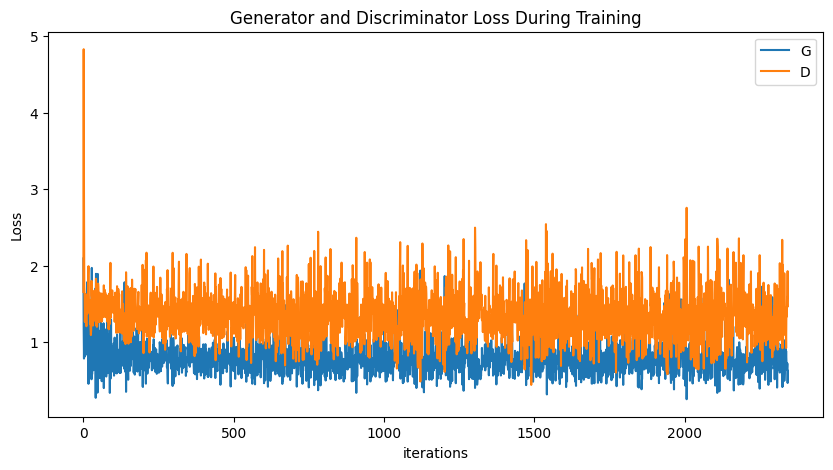

In [26]:
# Training Loop with Label Conditioning
import tqdm 

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, (real_images, labels) in tqdm.tqdm(enumerate(train_loader)):
        
        ############################
        # (1) Update D network
        ############################
        netD.zero_grad()
        
        # Format real batch
        real_cpu = real_images.to(device)
        labels = labels.long().to(device)

        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Forward pass real batch through D with matching labels
        output = netD(real_cpu, labels).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        # Generate fake images with matching labels
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake_labels = torch.LongTensor(torch.randint(0, 10, (real_cpu.size(0),))).to(device)  # Random labels for fake images
        
        fake = netG(noise, fake_labels)
        label.fill_(fake_label)
        
        # Classify fake batch with D
        output = netD(fake.detach(), fake_labels).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network
        ############################
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake, fake_labels).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Output training stats
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check generator progress by generating each digit
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise, fixed_labels).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True, nrow=10))

        iters += 1

# Plot training losses
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Save the model for testing :

In [27]:
#Save the generator model
torch.save(netG.state_dict(), "netG_digit_cond.pth")
#Save the discriminator model
torch.save(netD.state_dict(), "netD_digit_cond.pth")

Test the model for each digit : 

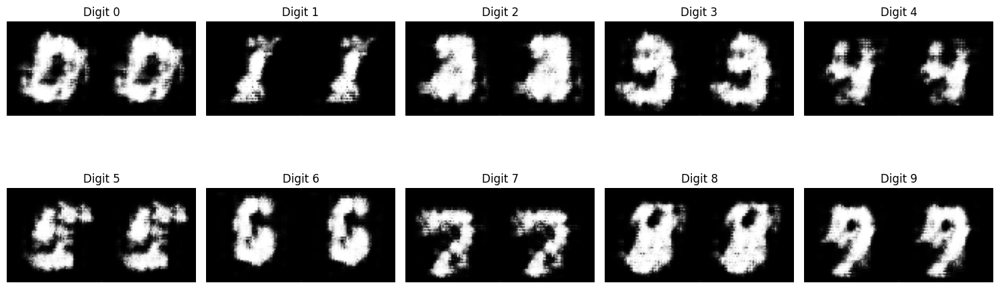

In [28]:
import time

netG = GeneratorConditioned(ngpu).to(device)
# Load the generator model
netG.load_state_dict(torch.load("netG_digit_cond.pth"))
netG.eval()

@torch.no_grad()
def generate_digit(label, seed=None):
    # Set random seed if provided
    if seed is not None:
        torch.manual_seed(seed)
    
    # Start from random noise
    image = torch.randn(1, nz, 1, 1).to(device)
    label = torch.tensor([label]).to(device)  # Added .long()
    
    # Generate the image
    image = netG(image, label).detach().cpu()
    return image

plt.figure(figsize=(15, 6))

# Generate examples - using current time as seed
current_time = int(time.time())

# Generate examples with different seeds
for digit in range(10):
    plt.subplot(2, 5, digit + 1)
    # Generate two examples of each digit
    generated1 = generate_digit(digit, seed=current_time + digit)
    generated2 = generate_digit(digit, seed=current_time + digit + 10)
    # Stack the two images horizontally
    imgs = torch.cat([generated1, generated2], dim=3)
    plt.imshow(imgs.squeeze().numpy(), cmap='gray')
    plt.axis('off')
    plt.title(f'Digit {digit}')

plt.tight_layout()
plt.show()

We can see that conditioning the generation allows to control what digit we want to generate. However, the quality is worse than the one we had earlier.

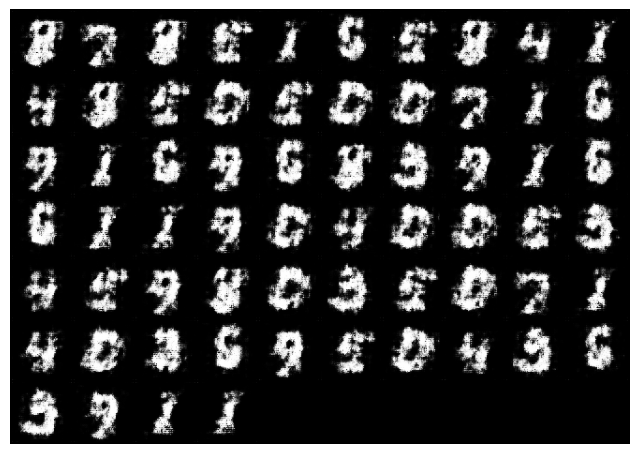

In [29]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# Part 2: Conditional GAN (cGAN)

Let's take the example of the set described in the following picture:  

<p align="center">
<img height=300px src="https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/map_streetview.png"/></p>
<p align="center"></p>

We have a picture of a map (from Google Maps) and we want to create an image of what the satellite view may look like.

Therefore, we do not only want to generate a picture from random noise, but rather generate a picture from another picture. For this purpose we will use a cGAN instead of a vanilla GAN, which was introduced in this [paper](https://arxiv.org/pdf/1611.07004.pdf).

A cGAN is a supervised GAN aiming at mapping a label picture to a real one or a real picture to a label one. As you can see in the diagram below, the discriminator will take as input a pair of images and try to predict if the pair was generated or not. The generator will not generate an image from noise but will intead use an image (label or real) to generate another one (real or label).  

<p align="center">
<img height=300px src="https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/cgan_map.png"/></p>
<p align="center"></p>

### Generator

In the cGAN architecture, the generator chosen is a U-Net.

<p align="center">
<img height=300px src="https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/unet.png"/></p>
<p align="center"></p>

A U-Net takes as input an image, and outputs another image.

It can be divided into 2 subparts : an encoder and a decoder.
* The encoder takes the input image and reduces its dimension to encode the main features into a vector.
* The decoder takes this vector and map the features stored into an image.

A U-Net architecture is different from a vanilla convolutional encoder-decoder in that every layer of the decoder takes as input the previous decoded output as well as the output feature map from the encoder layers of the same level. This allows the decoder to map low frequencies information encoded during the descent as well as high frequencies from the original picture.

<p align="center">
<img height=300px src="https://www.researchgate.net/profile/Baris_Turkbey/publication/315514772/figure/fig2/AS:485824962797569@1492841105670/U-net-architecture-Each-box-corresponds-to-a-multi-channel-features-maps-The-number-of.png"/></p>
<p align="center"></p>

The architecture we will implement is the following (the number in the square is the number of filters used).

<p align="center">
<img height=300px src="https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/unet_architecture.png"/></p>
<p align="center"></p>

The encoder will take as input a colored picture (3 channels: RGB), it will pass through a series of convolution layers to encode the features of the picture. It will then be decoded by the decoder using transposed convolutional layers. These layers will take as input the previous decoded vector AND the encoded features of the same level.

For this part the objective is to use a cGAN to generate facades from a template image. For this purpose, we will use the "Facade" dataset.

<p align="center">
<img height=250px src="https://storage.googleapis.com/kaggle-datasets-images/926166/1567332/1fd1b7ec805d92b48a1227c376044d0b/dataset-cover.png"/></p>
<p align="center"></p>

Let's start by creating a few classes describing the layers we will use in the U-Net.

In [ ]:
# Importing all the libraries needed
import os
import glob
import torch
import kagglehub

import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

from torch import nn
from PIL import Image
from torch.utils.data import Dataset, DataLoader

/Users/stevan/Documents/Centrale Lyon/3A/Machine Learning/gan-diffusion/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# code adapted from https://github.com/milesial/Pytorch-UNet/blob/master/unet/unet_parts.py

# Input layer
class inconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(inconv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

# Encoder layer
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

# Decoder layer
class up(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=False):
        super(up, self).__init__()
        if dropout :
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
                nn.BatchNorm2d(out_ch),
                nn.Dropout(0.5, inplace=True),
                nn.ReLU(inplace=True)
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

    def forward(self, x1, x2):
        x1 = self.conv(x1)
        x = torch.cat([x1, x2], dim=1)
        return x

# Output layer
class outconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(outconv, self).__init__()
        self.conv = nn.Sequential(
              nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
              nn.Tanh()
        )

    def forward(self, x):
        x = self.conv(x)
        return x

Now let's create the U-Net using the helper classes defined previously.

In [ ]:
class U_Net(nn.Module):
    '''
    Ck denotes a Convolution-BatchNorm-ReLU layer with k filters.
    CDk denotes a Convolution-BatchNorm-Dropout-ReLU layer with a dropout rate of 50%
    Encoder:
      C64   - C128   - C256   - C512  - C512  - C512 - C512 - C512
    Decoder:
      CD512 - CD1024 - CD1024 - C1024 - C1024 - C512 - C256 - C128
    '''
    def __init__(self, n_channels, n_classes):
        super(U_Net, self).__init__()
        # Encoder
        self.inc = inconv(n_channels, 64) # 64 filters
        # TODO :
        # Create the 7 encoder layers called "down1" to "down7" following this sequence
        # C64   - C128   - C256   - C512  - C512  - C512 - C512 - C512
        # The first one has already been implemented
        self.down1 = down(64, 128)
        self.down2 = down(128, 256)
        self.down3 = down(256, 512)
        self.down4 = down(512, 512)
        self.down5 = down(512, 512)
        self.down6 = down(512, 512)
        self.down7 = down(512, 512)


        # Decoder
        # TODO :
        # Create the 7 decoder layers called up1 to up7 following this sequence :
        # CD512 - CD1024 - CD1024 - C1024 - C1024 - C512 - C256 - C128
        # The last layer has already been defined
        self.up7 = up(512, 512, dropout=True)
        self.up6 = up(1024, 512, dropout=True)
        self.up5 = up(1024, 512, dropout=True)
        self.up4 = up(1024, 512)
        self.up3 = up(1024, 256)
        self.up2 = up(512, 128)
        self.up1 = up(256, 64)


        self.outc = outconv(128, n_classes) # 128 filters

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x6 = self.down5(x5)
        x7 = self.down6(x6)
        x8 = self.down7(x7)
        # At this stage x8 is our encoded vector, we will now decode it
        x = self.up7(x8, x7)
        x = self.up6(x, x6)
        x = self.up5(x, x5)
        x = self.up4(x, x4)
        x = self.up3(x, x3)
        x = self.up2(x, x2)
        x = self.up1(x, x1)
        x = self.outc(x)
        return x

In [ ]:
# We take images that have 3 channels (RGB) as input and output an image that also have 3 channels (RGB)
generator = U_Net(3, 3)

# Check that the architecture is as expected
print(generator)

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

You should now have a working U-Net.

<font color='red'>**Question**</font>                                                                  
Knowing the input and output images will have the shape 256x256 with 3 channels, what will be the dimension of the feature map "x8" ?

**Convolution Formula**

The output height and width after applying a convolutional layer are given by:

$ H_{\text{out}} = \frac{H_{\text{in}} - K + 2P}{S} + 1 $

$ W_{\text{out}} = \frac{W_{\text{in}} - K + 2P}{S} + 1 $

where:
- $ H_{\text{in}}, W_{\text{in}} $ are the input height and width,
- $ K $ is the kernel size,
- $ P $ is the padding,
- $ S $ is the stride.

**Example Calculation**

For an input of size $ 256 \times 256 $, applying a convolution with:
- Kernel size \( K = 4 \),
- Stride \( S = 2 \),
- Padding \( P = 1 \),

The output size is:

$ H_{\text{out}} = \frac{256 - 4 + 2 \times 1}{2} + 1 = \frac{254}{2} + 1 = 128 $

$ W_{\text{out}} = \frac{256 - 4 + 2 \times 1}{2} + 1 = 128 $

Thus, after all the encoding steps, the feature map "x8" will have dimensions 1x1x512, meaning it will be an array of dimension 512.


<font color='red'>**Question**</font>                                                                  
As you can see, U-net has an encoder-decoder architecture with skip connections. Explain what is the point of the skip connections.

Skip connections in U-Net allow the decoder to utilize both low-frequency information from the encoder and high-frequency details from the original image, improving spatial accuracy and feature preservation

### Discriminator

In the cGAN architecture, the chosen discriminator is a Patch GAN. Instead of classifying if the whole image is fake or not (binary classification), this discriminator tries to classify if each N × N patch in an image is real or fake.

![patch GAN](https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/patchGAN.png)

The size N is given by the depth of the net. According to this table :

| Number of layers | N |
| ---- | ---- |
| 1 | 16 |
| 2 | 34 |
| 3 | 70 |
| 4 | 142 |
| 5 | 286 |
| 6 | 574 |

The number of layers actually means the number of layers with `kernel=(4,4)`, `padding=(1,1)` and `stride=(2,2)`. These layers are followed by 2 layers with `kernel=(4,4)`, `padding=(1,1)` and `stride=(1,1)`.
In our case we are going to create a 70x70 PatchGAN.

Let's first create a few helping classes.

In [ ]:
class conv_block(nn.Module):
    def __init__(self, in_ch, out_ch, use_batchnorm=True, stride=2):
        super(conv_block, self).__init__()
        if use_batchnorm:
            self.conv = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=stride),
                nn.BatchNorm2d(out_ch),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )
        else:
            self.conv = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=stride),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )

    def forward(self, x):
        x = self.conv(x)
        return x


class out_block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(out_block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, 1, kernel_size=4, padding=1, stride=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv(x)
        return x

Now let's create the Patch GAN discriminator.
As we want a 70x70 Patch GAN, the architecture will be as follows :
```
1. C64  - K4, P1, S2
2. C128 - K4, P1, S2
3. C256 - K4, P1, S2
4. C512 - K4, P1, S1
5. C1   - K4, P1, S1 (output)
```
Where Ck denotes a convolution block with k filters, Kk a kernel of size k, Pk is the padding size and Sk the stride applied.
*Note :* For the first layer, we do not use batchnorm.

<font color='red'>**Question**</font>                                                                  
Knowing input images will be 256x256 with 3 channels each, how many learnable parameters this neural network has ?


For 256×256 RGB images with 3 channels each, the PatchGAN discriminator has **2,768,641 learnable parameters**:

- **conv1**: 6×64×4×4 = 6,144 (no batch norm)
- **conv2**: 64×128×4×4 + 128×2 = 131,328
- **conv3**: 128×256×4×4 + 256×2 = 524,800
- **conv4**: 256×512×4×4 + 512×2 = 2,098,176
- **out**: 512×1×4×4 + 1 = 8,193

In [ ]:
class PatchGAN(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(PatchGAN, self).__init__()
        # TODO : create the 4 first layers named conv1 to conv4
        self.conv1 = conv_block(n_channels, 64, use_batchnorm=False, stride=2)
        self.conv2 = conv_block(64, 128, use_batchnorm=True, stride=2)
        self.conv3 = conv_block(128, 256, use_batchnorm=True, stride=2)
        self.conv4 = conv_block(256, 512, use_batchnorm=True, stride=1)
        # output layer
        self.out = out_block(512, n_classes)

    def forward(self, x1, x2):
        x = torch.cat([x2, x1], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.out(x)
        return x

In [ ]:
# We have 6 input channels as we concatenate 2 images (with 3 channels each)
discriminator = PatchGAN(6, 1)

print(discriminator)

PatchGAN(
  (conv1): conv_block(
    (conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv2): conv_block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv3): conv_block(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv4): conv_block(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReL

You should now have a working discriminator.

### Loss functions

The global loss function will be made of 2 parts :
* The vanilla GAN loss, in which the discriminator tries to maximize the probability it correctly classifies reals and fakes and the generator tries to minimize the probability that the discriminator will predict its outputs are fake.
* An auxiliary image reconstruction objective, in which the generator not only has to fool the discriminator, but also generate an image that is near to the ground truth image.

Therefore, the loss can be defined as: $$ G^* = arg\ \underset{G}{min}\ \underset{D}{max}\ \mathcal{L}_{cGAN}(G, D) + \lambda \mathcal{L}_{L1}(G)$$  
In which
$$ \mathcal{L}_{cGAN}(G, D) = \mathbb{E}_{x, y}\big[logD(x, y)\big] + \mathbb{E}_{x, z}\big[log(1 - D(x, G(x, z)))\big] $$
$$ \mathcal{L}_{L1}(G) = \mathbb{E}_{x, y, z}\big[||y - G(x, z)||_1\big] $$

In [ ]:
# Loss functions
criterion_GAN = torch.nn.BCELoss()
criterion_pixelwise = torch.nn.L1Loss()

# Loss weight of L1 pixel-wise loss between translated image and real image
lambda_pixel = 100

### Training and evaluating models

In [ ]:
# parameters
num_epochs = 200        # number of epochs of training
batch_size = 16         # size of the batches
lr = 2e-4               # learning rate
b1 = 0.5                # decay of first order momentum of gradient
b2 = 0.999              # decay of second order momentum of gradient
img_height = 256        # size of image height
img_width = 256         # size of image width
channels = 3            # number of image channels
device = torch.device("mps") if torch.backends.mps.is_available() else "cuda"

Download the Facades dataset


In [ ]:
dataset_path = kagglehub.dataset_download("kokeyehya/cmp-facade-db-base")

print("Path to dataset files:", dataset_path)

Path to dataset files: /Users/stevan/.cache/kagglehub/datasets/kokeyehya/cmp-facade-db-base/versions/1


Configure the dataloader

In [ ]:
class FacadeDataset(Dataset):
    def __init__(self, root, transforms_=None, mode='train'):
        self.transform = transforms.Compose(transforms_)
        self.images_path = sorted(glob.glob(root + '/base/*.jpg'))

        if mode == 'train':
            self.images_path = self.images_path[:int(len(self.images_path) * 0.95)]
        elif mode == 'val':
            self.images_path = self.images_path[int(len(self.images_path) * 0.95):]
        else:
            raise Exception('Invalid mode! It must be either train or val')

        self.masks_path = [image.split(".jpg")[0] + ".png" for image in self.images_path]
        assert len(self.images_path) == len(self.masks_path), "Number of images and masks must be the same"


    def __getitem__(self, index):
        img = Image.open(self.images_path[index])
        mask = Image.open(self.masks_path[index])
        mask = mask.convert('RGB')

        img = self.transform(img)
        mask = self.transform(mask)

        return img, mask

    def __len__(self):
        return len(self.images_path)

# Configure dataloaders
transforms_ = [transforms.Resize((img_height, img_width), Image.BICUBIC),
               transforms.ToTensor()]

dataloader = DataLoader(FacadeDataset(dataset_path, transforms_=transforms_),
                        batch_size=batch_size, shuffle=True, drop_last=True, num_workers=0)

val_dataloader = DataLoader(FacadeDataset(dataset_path, transforms_=transforms_, mode='val'),
                            batch_size=batch_size, shuffle=False)

Check if the loading works and add few helper functions

In [ ]:
def plot2x2Array(image, mask):
    f, axarr = plt.subplots(1, 2)
    axarr[0].imshow(image)
    axarr[1].imshow(mask)

    axarr[0].set_title('Image')
    axarr[1].set_title('Mask')


def reverse_transform(image):
    image = image.numpy().transpose((1, 2, 0))
    image = np.clip(image, 0, 1)
    image = (image * 255).astype(np.uint8)

    return image

def plot2x3Array(image, mask,predict):
    f, axarr = plt.subplots(1,3,figsize=(15,15))
    axarr[0].imshow(image)
    axarr[1].imshow(mask)
    axarr[2].imshow(predict)
    axarr[0].set_title('input')
    axarr[1].set_title('real')
    axarr[2].set_title('fake')

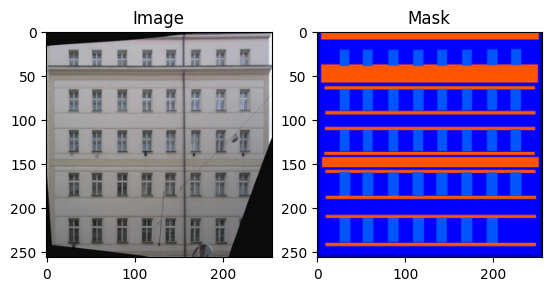

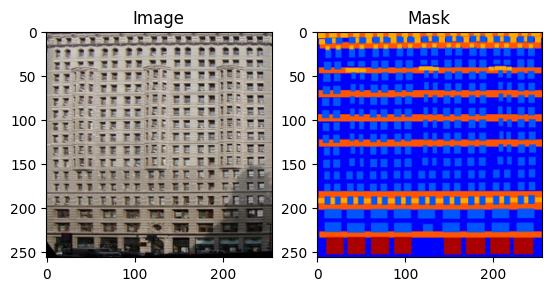

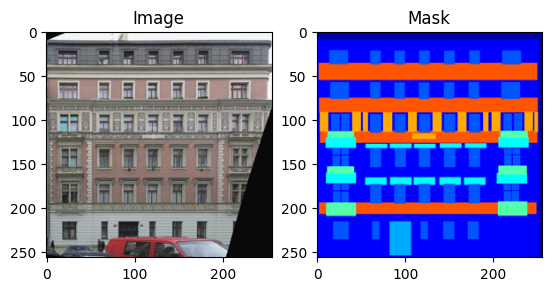

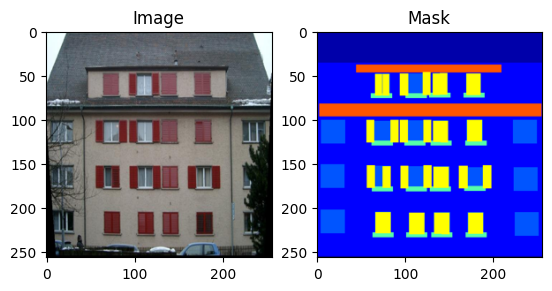

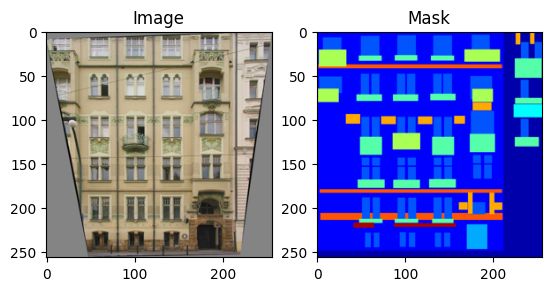

In [ ]:
images, masks = next(iter(dataloader))

for i in range(5):
    image = reverse_transform(images[i])
    mask = reverse_transform(masks[i])
    plot2x2Array(image, mask)

Initialize our GAN

In [ ]:
# Calculate output of image discriminator (PatchGAN)
patch_size = (1, img_height//2**3-2, img_width//2**3-2)

generator = generator.to(device)
discriminator = discriminator.to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

Additional auxiliary functions

In [ ]:
def save_model(epoch, loss_D, loss_G):
    # save your model weights
    torch.save({
                'epoch': epoch,
                'model_state_dict': generator.state_dict(),
                'optimizer_state_dict': optimizer_G.state_dict(),
                'loss': loss_G,
                }, 'generator_'+str(epoch)+'.pth')
    torch.save({
                'epoch': epoch,
                'model_state_dict': discriminator.state_dict(),
                'optimizer_state_dict': optimizer_D.state_dict(),
                'loss': loss_D,
                }, 'discriminator_'+str(epoch)+'.pth')

def weights_init_normal(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
      torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm2d') != -1:
      torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
      torch.nn.init.constant_(m.bias.data, 0.0)

Train the model !  
But first, complete the loss function in the following training loop:  

In [ ]:
# ----------
#  Training
# ----------

losses = []

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# train the network
discriminator.train()
generator.train()
print_every = 400

for epoch in range(num_epochs):
    for i, batch in enumerate(dataloader):
        # Model inputs
        images, masks = batch
        images = images.to(device)
        masks = masks.to(device)

        # Discriminator labels
        valid = torch.ones((images.size(0), *patch_size), requires_grad=False).to(device)
        fake = torch.zeros((images.size(0), *patch_size), requires_grad=False).to(device)

        # ------------------
        #  Train Generators
        # ------------------

        optimizer_G.zero_grad()

        # GAN loss
        # TODO: Put here your GAN loss
        generated_images = generator(masks)
        fake_validity = discriminator(generated_images, masks)
        loss_GAN = criterion_GAN(fake_validity, valid)

        # Pixel-wise loss
        # TODO: Put here your pixel loss
        loss_pixel = criterion_pixelwise(generated_images.detach(), images)


        # Total loss
        # TODO: Put here your total loss for the generator
        loss_G = loss_GAN + lambda_pixel * loss_pixel


        loss_G.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Real loss
        pred_real = discriminator(images, masks)
        loss_real = criterion_GAN(pred_real, valid)

        # Fake loss
        pred_fake = discriminator(generated_images.detach(), masks)
        loss_fake = criterion_GAN(pred_fake, fake)

        # Total loss
        loss_D = 0.5 * (loss_real + loss_fake)

        loss_D.backward()
        optimizer_D.step()

        # Print some loss stats
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}][{i}/{len(dataloader)}] | d_loss: {loss_D.item():6.4f} | g_loss: {loss_G.item():6.4f}')

    # Keep track of discriminator loss and generator loss
    losses.append((loss_D.item(), loss_G.item()))

    if (epoch + 1) % 100 == 0:
        print('Saving model...')
        save_model(epoch+1, loss_D, loss_G)


Epoch [1/200][0/22] | d_loss: 0.8687 | g_loss: 49.4909
Epoch [2/200][0/22] | d_loss: 0.6853 | g_loss: 31.5067
Epoch [3/200][0/22] | d_loss: 0.7556 | g_loss: 26.3221
Epoch [4/200][0/22] | d_loss: 0.6495 | g_loss: 27.3460
Epoch [5/200][0/22] | d_loss: 0.6872 | g_loss: 28.4116
Epoch [6/200][0/22] | d_loss: 0.6716 | g_loss: 24.3616
Epoch [7/200][0/22] | d_loss: 0.7227 | g_loss: 26.9823
Epoch [8/200][0/22] | d_loss: 0.7084 | g_loss: 24.8962
Epoch [9/200][0/22] | d_loss: 0.6923 | g_loss: 25.0969
Epoch [10/200][0/22] | d_loss: 0.6605 | g_loss: 25.3908
Epoch [11/200][0/22] | d_loss: 0.6769 | g_loss: 29.5508
Epoch [12/200][0/22] | d_loss: 0.6803 | g_loss: 28.0581
Epoch [13/200][0/22] | d_loss: 0.6904 | g_loss: 28.1728
Epoch [14/200][0/22] | d_loss: 0.6645 | g_loss: 24.5133
Epoch [15/200][0/22] | d_loss: 0.6640 | g_loss: 23.1350
Epoch [16/200][0/22] | d_loss: 0.6555 | g_loss: 27.7811
Epoch [17/200][0/22] | d_loss: 0.6584 | g_loss: 29.1314
Epoch [18/200][0/22] | d_loss: 0.6219 | g_loss: 24.8533
E

Observation of the loss along the training

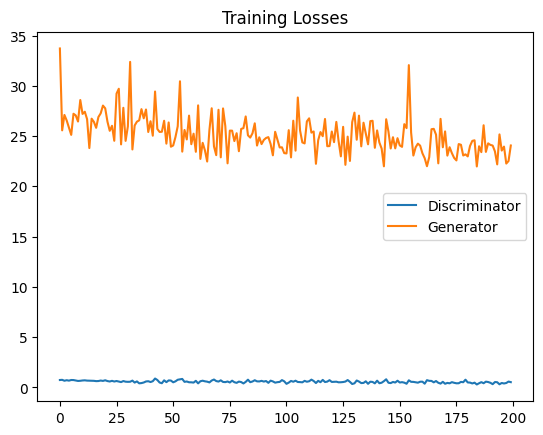

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()

If the training takes too much time, you can use a pretrained model in the meantime, to evaluate its performance.

It is available at : https://partage.liris.cnrs.fr/index.php/s/xwEFmxn9ANeq4zY

### Evaluate your cGAN

In [ ]:
def load_model(epoch=200):
    if 'generator_'+str(epoch)+'.pth' in os.listdir() and 'discriminator_'+str(epoch)+'.pth' in os.listdir():
        checkpoint_generator = torch.load('generator_'+str(epoch)+'.pth', map_location=device)
        generator = U_Net(3, 3).to(device)
        generator.load_state_dict(checkpoint_generator['model_state_dict'])
        optimizer_G.load_state_dict(checkpoint_generator['optimizer_state_dict'])
        epoch_G = checkpoint_generator['epoch']
        loss_G = checkpoint_generator['loss']

        checkpoint_discriminator = torch.load('discriminator_'+str(epoch)+'.pth', map_location=device)
        discriminator.load_state_dict(checkpoint_discriminator['model_state_dict'])
        optimizer_D.load_state_dict(checkpoint_discriminator['optimizer_state_dict'])
        epoch_D = checkpoint_discriminator['epoch']
        loss_D = checkpoint_discriminator['loss']

        return generator

    else:
        print('There isn\' a training available with this number of epochs')

In [ ]:
generator200 = load_model(epoch=200)

# switching mode
generator200.eval()

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

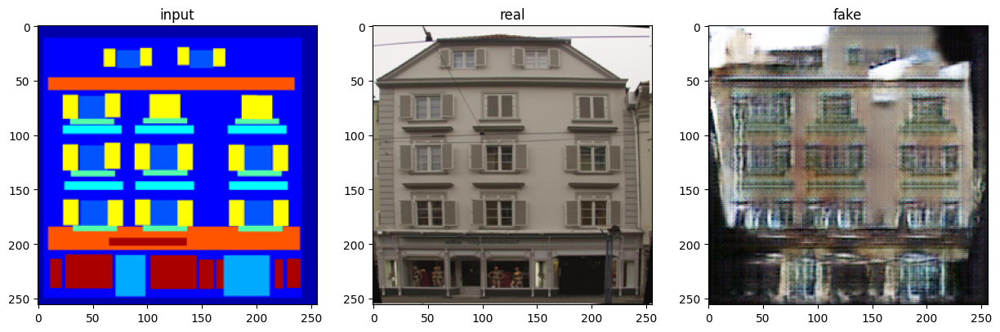

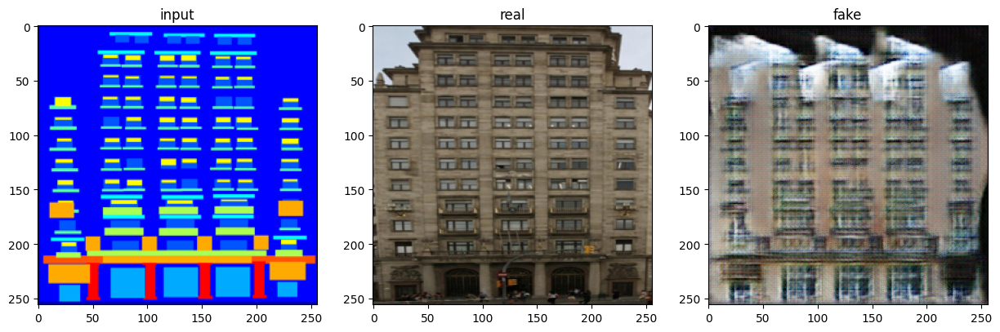

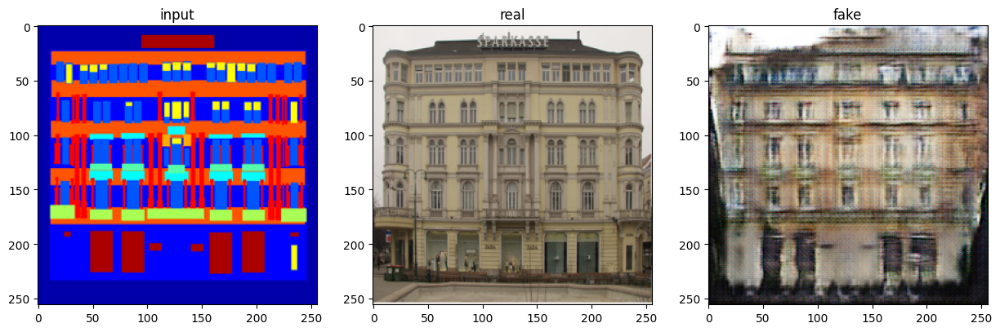

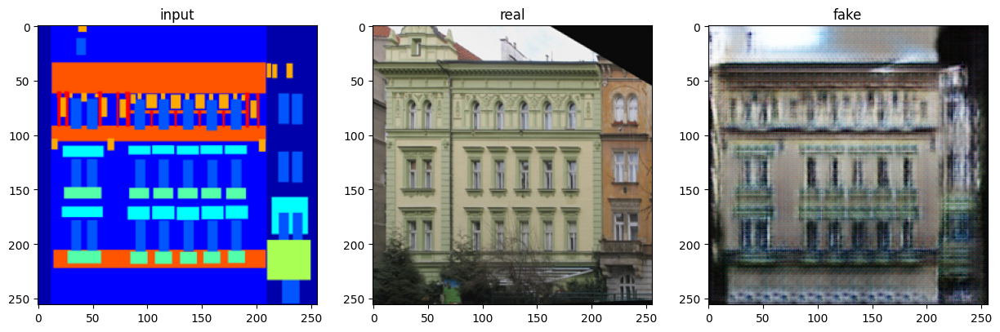

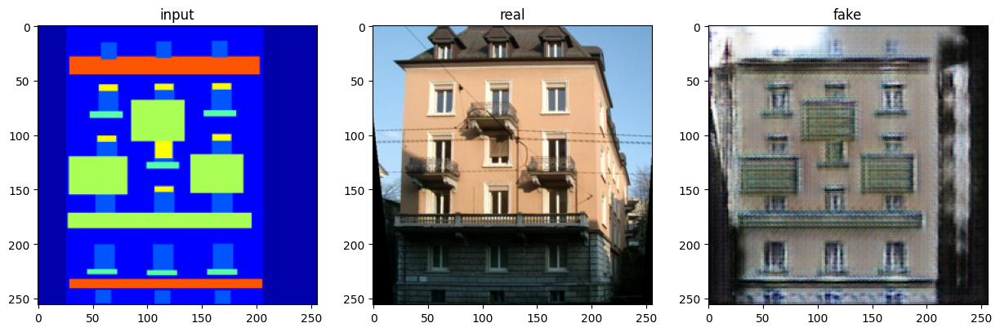

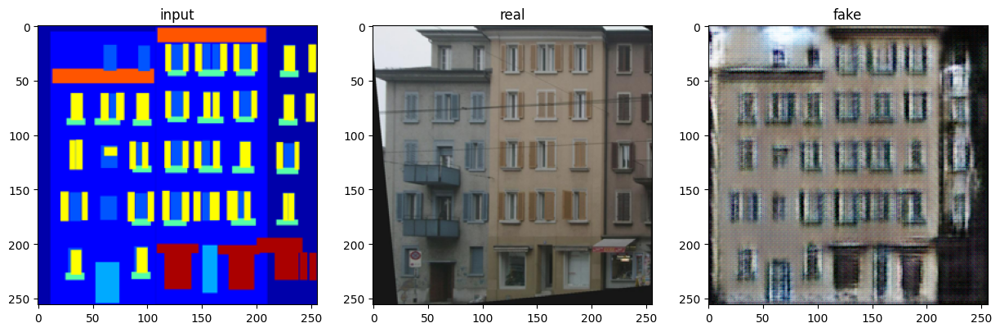

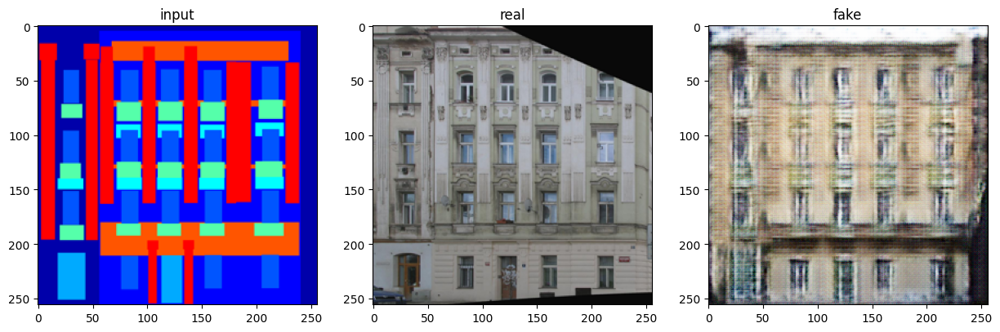

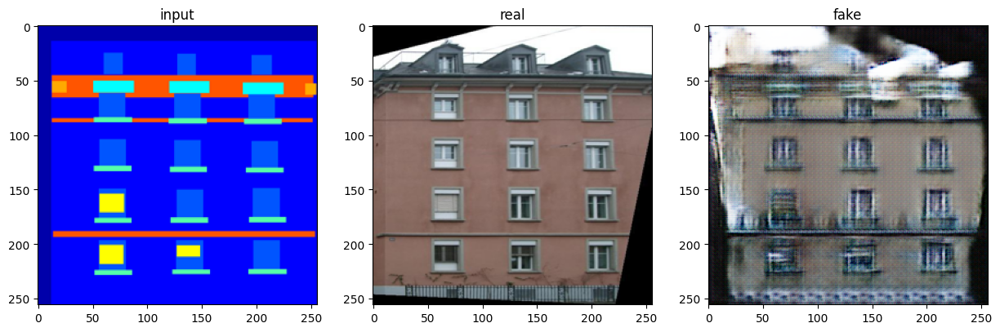

In [ ]:
# show a sample evaluation image on the training base
image, mask = next(iter(dataloader))
output = generator200(mask.to(device))
output = output.cpu().detach()

for i in range(8):
    image_plot = reverse_transform(image[i])
    output_plot = reverse_transform(output[i])
    mask_plot = reverse_transform(mask[i])
    plot2x3Array(mask_plot,image_plot,output_plot)


<font color='red'>**Question**</font>                                                                  
Compare results of your model after 100 and 200 epochs

In [ ]:
def plot_compare(image, mask,gen100, gen200):
    f, axarr = plt.subplots(1,4,figsize=(15,15))
    axarr[0].imshow(image)
    axarr[1].imshow(mask)
    axarr[2].imshow(gen100)
    axarr[3].imshow(gen200)
    axarr[0].set_title('input')
    axarr[1].set_title('real')
    axarr[2].set_title('generator 100 epochs')
    axarr[3].set_title('generator 200 epochs')

In [ ]:
generator100 = load_model(epoch=100)

# switching mode
generator100.eval()

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

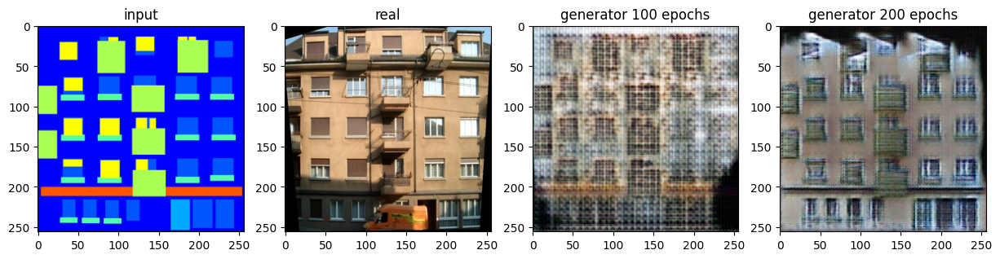

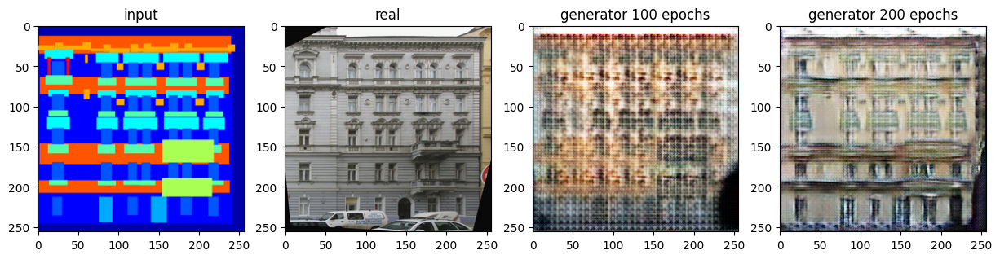

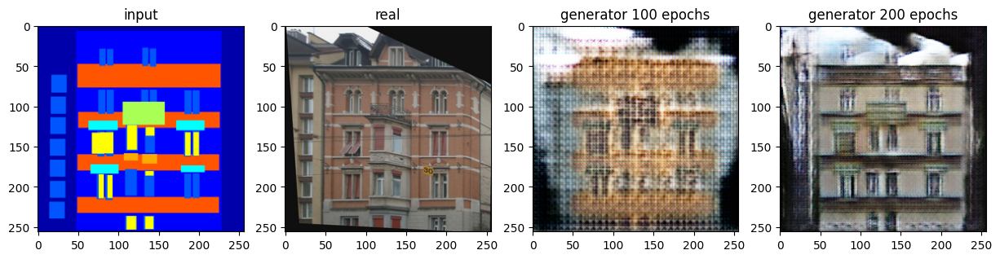

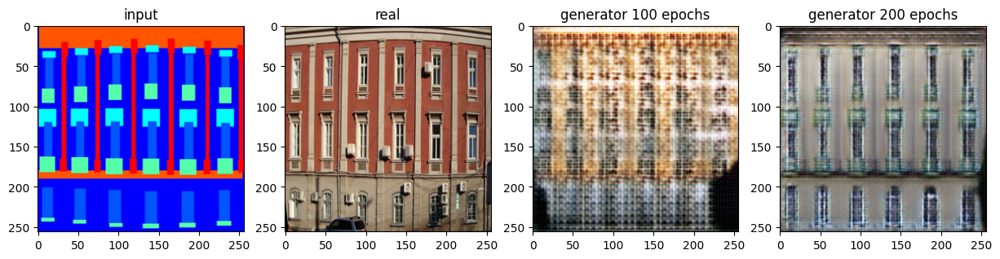

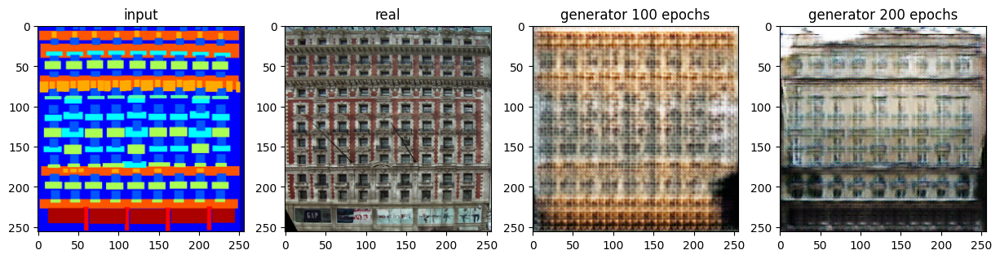

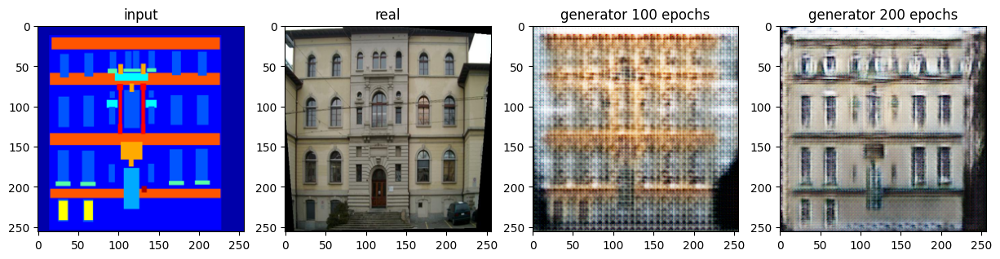

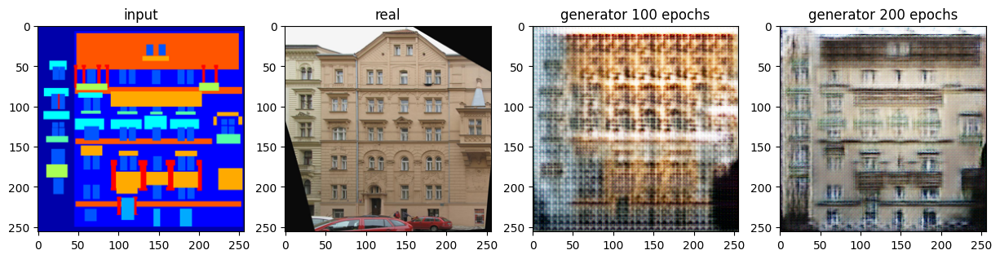

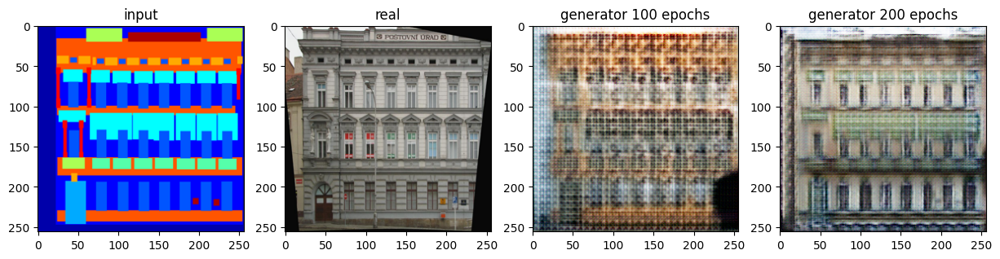

In [ ]:
# TODO : Your code here to load and evaluate with a few samples the 2 checkpoints (100 epochs and 200 epochs)
image, mask = next(iter(dataloader))

output100 = generator100(mask.to(device))
output100 = output100.cpu().detach()

output200 = generator200(mask.to(device))
output200 = output200.cpu().detach()

for i in range(8):
    image_plot = reverse_transform(image[i])
    output100_plot = reverse_transform(output100[i])
    output200_plot = reverse_transform(output200[i])

    mask_plot = reverse_transform(mask[i])
    plot_compare(mask_plot,image_plot,output100_plot, output200_plot)


We can easily see that after 200 epochs of training, the images generated are a lot closer to reality than after 100 epochs.

# Part 3: Diffusion

Diffusion models are probabilistic generative models which learn to generate data by iteratively refining random noise through a reverse diffusion process. Given a sample of data, noise is progressvely added in small steps until it becomes pure noise. Then, a neural network is trained to reverse this process and generate realistic data from noise.  

<p align="center">
<img height=300px src="https://substackcdn.com/image/fetch/f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F2f5d7da7-52db-4104-9742-a0b4555d8dd6_1300x387.png"/></p>
<p align="center"></p>

Diffusion models have gained popularity due to their ability to generate high-quality, diverse, and detailed content, surpassing GANs in the quality of the generated images.  

In this assignment we will focus on DDPMs, which were introduced in this [paper](https://arxiv.org/abs/2006.11239) and laid the foundation for generative diffusion models.









For this part, we will use the MNIST dataset, used in part 1

In [2]:
# TODO: change the variable name to match the one you used in part 1 or reload the dataset

# Import required libraries
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader

image_size = 64
batch_size = 128

# Download MNIST Dataset
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Download training data
mnist_dataset = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

# Download test data
mnist_test_dataset = torchvision.datasets.MNIST(
    root='./data',
    train=False,
    download=True,
    transform=transform
)

mnist_dataloader = DataLoader(mnist_dataset, batch_size=batch_size, shuffle=True)
mnist_test_dataloader = DataLoader(mnist_test_dataset, batch_size=batch_size, shuffle=False)

100%|██████████| 9.91M/9.91M [00:00<00:00, 16.2MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 489kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.53MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 12.1MB/s]


Auxiliary function for plotting images

In [3]:
def plot1xNArray(images, labels):
    f, axarr = plt.subplots(1, len(images))

    for image, ax, label in zip(images, axarr, labels):
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        ax.set_title(label)

In order to train the model with the diffusion process, we will use a noise scheduler, which will be in charge of the forward diffusion process. The scheduler takes an image, a sample of random noise and a timestep, and return a noisy image for the corresponding timestep. Noise is progressvely added to the image at each timestep, therefore a noisy image at timestep 0 will have barely any noise while a noisy image at the maximum timestep will be basically just noise.  

Let's create a noise scheduler with 1000 max timesteps and visualize some noise images.  

We will use the diffusers library, which provides several tools for training and using diffusion models.  

In [8]:
def reverse_transform(image):
    image = image.numpy().transpose((1, 2, 0))
    image = np.clip(image, 0, 1)
    image = (image * 255).astype(np.uint8)

    return image

device = torch.device("mps") if torch.backends.mps.is_available() else "cuda"

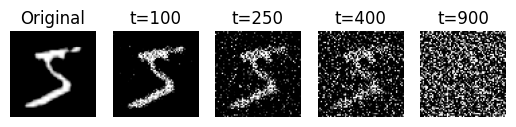

In [6]:
from diffusers import DDPMScheduler

# TODO: Create the scheduler
noise_scheduler = DDPMScheduler(
    num_train_timesteps=1000,
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="linear",
    clip_sample=False,
)

image, _ = mnist_dataset[0]

# TODO: Create a noise tensor sampled from a normal distribution with the same shape as the image
noise = torch.randn_like(image)

images, labels = [reverse_transform(image)], ["Original"]

for i in [100, 250, 400, 900]:
    timestep = torch.LongTensor([i])
    noisy_image = noise_scheduler.add_noise(image, noise, timestep)
    images.append(reverse_transform(noisy_image))
    labels.append(f"t={i}")

plot1xNArray(images, labels)

For the reverse diffusion process we will use a neural network. Given a noisy image and the corresponding timestep, the goal of the neural network is to predict the noise, which allows for the denoising.  

For the model, we will have a similar architecture as we used for the cGAN generator, a 2D UNet with a few modifications. The main difference will be that we have to indicate to the model which timestep is currently being denoised. For that purpose a timestep embedding is added, therefore the model has 2 inputs, the noisy image and the corresponding timestep.  
  
In this exercise, we will use an UNet implementation from the diffusers library, which already has the timestep embedding included.

In [9]:
from diffusers import UNet2DModel

# TODO: Complete the parameters
diffusion_backbone = UNet2DModel(
                        block_out_channels=(64, 128, 256, 512),
                        down_block_types=("DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D"),
                        up_block_types=("UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D"),
                        sample_size=image_size,
                        in_channels=1,
                        out_channels=1,
                    ).to(device)

# Optimizer
optimizer = torch.optim.AdamW(diffusion_backbone.parameters(), lr=1e-4)

print(diffusion_backbone)

UNet2DModel(
  (conv_in): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(64, 64, ker

<font color='red'>Question</font>  
What are the differences between the UNet used for the cGAN generator and the one defined above ?  
Indicate the differences in the architecture by analyzing both models \_\_str\_\_.

## Differences between cGAN Generator UNet and UNet2DModel

| Feature | cGAN UNet | UNet2DModel (Diffusers) |
|---------|-----------|-------------------------|
| **Purpose** | Conditional image generation | Denoising in diffusion models |
| **Input** | Image mask/condition + noise | Noisy image + timestep embedding |
| **Timestep Conditioning** | No time conditioning | Includes timestep embeddings in each block |
| **Block Structure** | Standard convolutional blocks | Specialized ResNet blocks with time embedding |
| **Normalization** | Instance norm or batch norm | GroupNorm (typically with 32 groups) |
| **Skip Connections** | Direct concatenation | Feature addition with scale factor |
| **Activation Functions** | Leaky ReLU (encoder), ReLU (decoder) | SiLU/Swish activations throughout |
| **Output Design** | Optimized for one-step generation | Designed for iterative denoising steps |
| **Loss Function** | Adversarial loss + L1/L2 loss | Mean squared error to clean target |

UNet2DModel integrates temporal information through timestep embeddings at each layer, making it specifically adapted for the diffusion process. The cGAN UNet focuses on mapping from conditional input to target output in a single forward pass.

<font color='green'>**Bonus**</font>   
**Extend** the code of the UNet used in part 2 to add the timestep conditioning. Train it in the same way as the UNet2DModel from the diffusers library (using the DDPMScheduler) and compare the results. As in the first bonus exercise, add a label conditioning which allows to control the output of the model (i.e. generate a specific handwritten digit (e.g. "4") instead of a random one). Test the model, showcasing some examples.

Now, let's train the model

In [10]:
# ----------------
#  Training Loop
# ----------------
torch.backends.cudnn.deterministic = True

losses = []
num_epochs = 5
print_every = 100

diffusion_backbone.train()

for epoch in range(num_epochs):
    for i, batch in enumerate(mnist_dataloader):
        # Zero the gradients
        optimizer.zero_grad()

        # Send input to device
        images = batch[0].to(device)

        # Generate noisy images, different timestep for each image in the batch
        timesteps = torch.randint(noise_scheduler.config.num_train_timesteps, (images.size(0),), device=device)

        # TODO: Complete the code
        noise = torch.randn_like(images)
        noisy_images = noise_scheduler.add_noise(images, noise, timesteps)
        noisy_images = noisy_images.to(device)


        # Forward pass
        residual = diffusion_backbone(noisy_images, timesteps).sample

        # TODO: Compute the loss
        loss = torch.nn.functional.mse_loss(residual, noise)

        loss.backward()
        optimizer.step()

        # Print stats
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}][{i}/{len(mnist_dataloader)}] | loss: {loss.item():6.4f}')

    losses.append(loss.item())
    torch.save(diffusion_backbone.state_dict(), f"diffusion_{epoch+1}.pth")

Epoch [1/5][0/469] | loss: 1.1204
Epoch [1/5][100/469] | loss: 0.0258
Epoch [1/5][200/469] | loss: 0.0163
Epoch [1/5][300/469] | loss: 0.0123
Epoch [1/5][400/469] | loss: 0.0119
Epoch [2/5][0/469] | loss: 0.0105
Epoch [2/5][100/469] | loss: 0.0104
Epoch [2/5][200/469] | loss: 0.0104
Epoch [2/5][300/469] | loss: 0.0119
Epoch [2/5][400/469] | loss: 0.0089
Epoch [3/5][0/469] | loss: 0.0086
Epoch [3/5][100/469] | loss: 0.0087
Epoch [3/5][200/469] | loss: 0.0076
Epoch [3/5][300/469] | loss: 0.0083
Epoch [3/5][400/469] | loss: 0.0083
Epoch [4/5][0/469] | loss: 0.0087
Epoch [4/5][100/469] | loss: 0.0071
Epoch [4/5][200/469] | loss: 0.0073
Epoch [4/5][300/469] | loss: 0.0076
Epoch [4/5][400/469] | loss: 0.0072
Epoch [5/5][0/469] | loss: 0.0079
Epoch [5/5][100/469] | loss: 0.0074
Epoch [5/5][200/469] | loss: 0.0067
Epoch [5/5][300/469] | loss: 0.0068
Epoch [5/5][400/469] | loss: 0.0073


If the training takes too long, you can download an already trained model from [this link](https://partage.liris.cnrs.fr/index.php/s/AP2t6b3w8SM4Bp5) and use it for inference.

In [12]:
# TODO: Add the path to the model checkpoint for loading the model

diffusion_backbone.load_state_dict(torch.load("diffusion_5.pth"))
diffusion_backbone.eval()

UNet2DModel(
  (conv_in): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(64, 64, ker

Time to generate some images.  

During training, for each data sample, we take a random timestep and correspondent noisy image to give it as input to our model. With suffitient training, the model should learn how to predict the noise in a noisy image for all possible timesteps.  

During inference, to generate an image, we will start from pure noise and step by step predict the noise to go from one noisy image to the next, progressively denoising the image until we reach the timestep 0, in which we should have an image without any noise.

100%|██████████| 1000/1000 [00:57<00:00, 17.42it/s]


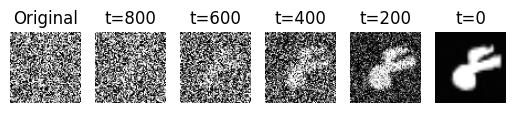

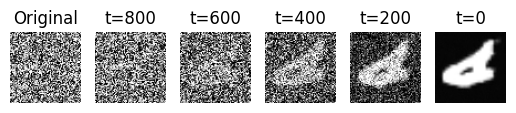

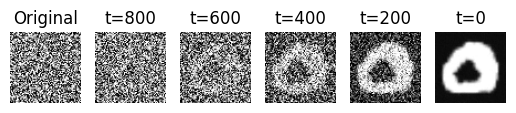

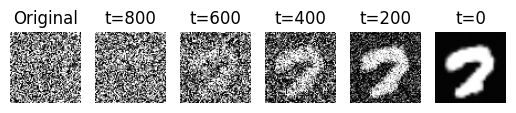

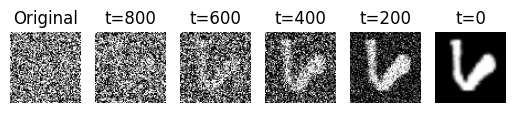

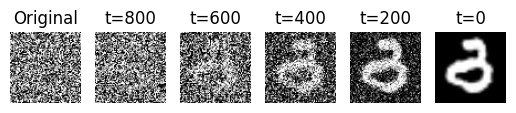

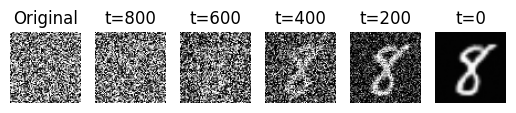

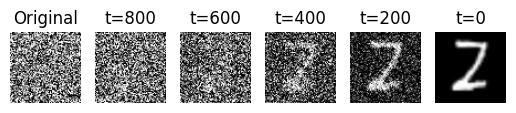

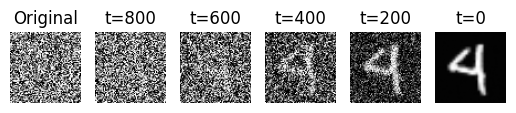

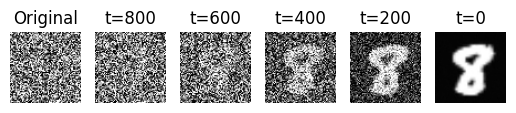

In [13]:
from tqdm import tqdm

# Start the image as random noise
image = torch.randn((10, 1, 64, 64)).to(device)

# Create a list of images and labels for visualization
images, labels = [(image / 2 + 0.5).clamp(0, 1).cpu().permute(0, 2, 3, 1).numpy()], ["Original"]

# Use the scheduler to iterate over timesteps
noise_scheduler.set_timesteps(1000)

for timestep in tqdm(noise_scheduler.timesteps):
    with torch.no_grad():
        residual = diffusion_backbone(image, timestep).sample
        image = noise_scheduler.step(residual, timestep, image).prev_sample

    if timestep.item() % 200 == 0:
        images.append((image / 2 + 0.5).clamp(0, 1).cpu().permute(0, 2, 3, 1).numpy())
        labels.append(f"t={timestep.item()}")

for i in range(images[0].shape[0]):
    plot1xNArray([img[i] for img in images], labels)

The diffusers library also provides *Pipeline* classes, which are wrappers around the model that abstracts the inference loop implemented above.  
  
We can create a pipeline, giving it the trained model and the noise scheduler, and use it to generate images. In this case, we will only have access to the final image, generated on the last timestep, but not the intermediary images from the denoising process.  

  0%|          | 0/1000 [00:00<?, ?it/s]

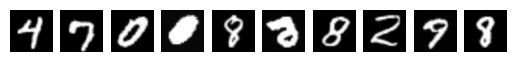

In [14]:
from diffusers import DDPMPipeline

pipeline = DDPMPipeline(diffusion_backbone, noise_scheduler)
generated_images = pipeline(10, output_type="np")

f, axarr = plt.subplots(1, len(generated_images["images"]))

for image, ax in zip(generated_images["images"], axarr):
    ax.imshow(image, cmap='gray')
    ax.axis('off')

# Part 4: What about those beautiful images ?

<p align="center">
<img height=300px src="https://huggingface.co/stabilityai/stable-diffusion-3.5-large/media/main/sd3.5_large_demo.png"/></p>
<p align="center"></p>

In this exercise we achieved decent results for very simple datasets. But we are quite far from those beautiful AI generated images we can find online. That is for 2 main reasons:
- Model size: due to the computation and time constrains, we can't really train very large models
- Dataset size: due to the same constrains, we can't use very complex and large datasets, which requires larger models and longer training times.

Fortunatly, even though we can train those large models with the available hardware and time, we can at least use them for inference !  

The goal of this part is to learn how to retrive and use a pre-trained diffusion models and also to get creative to come up with some nice prompts to generate cool images.  

We are going to use Stable Diffusion 3.5, which is a state of the art open-source text conditioned model. It takes a prompt in natural language and use it to guide the diffusion process. This type of models are trained with image-text pairs, but can generalize beyond the pairs seen during training, being able to mix several different concepts into a single image.  

In order to save memory, we will use quantization, which consists into converting the model weights types from float16 into float4. That simply means that each model weight will be stored using only 4 bits instead of 16 bits. That allows us to run the model in GPUs with less VRAM and have faster inference, with a small drop in the quality of the results.

For this part of the assignment restart the notebook kernel to be sure your GPU memory is empty. The memory usage can be verified using the command `nvidia-smi` in a terminal. If your GPU has 2GB of VRAM or less, the model will probably not fit into memory even with quantization. In that case, use Google Colab for this part or use the smaller model indicated below. If you are not happy with the results and have plenty of VRAM available, feel free to increase the quantization to 8 bits or even load the model without quantization.

Before downloading the model, got to its [HuggingFace page](https://huggingface.co/stabilityai/stable-diffusion-3.5-medium), log in with your account and accept the terms of use.

In [1]:
from diffusers import StableDiffusion3Pipeline
import torch

model_id = "stabilityai/stable-diffusion-3.5-medium"

# Configuration pour Apple Silicon
device = "mps" if torch.backends.mps.is_available() else "cpu"
dtype = torch.float16 if device == "mps" else torch.float32

# Charger le modèle sans quantization
pipeline = StableDiffusion3Pipeline.from_pretrained(
    model_id,
    torch_dtype=dtype,
    use_safetensors=True
)

# Configuration pour MPS ou CPU
if device == "mps":
    pipeline = pipeline.to(device)
else:
    pipeline.enable_model_cpu_offload()


/Users/stevan/Documents/Centrale Lyon/3A/Machine Learning/gan-diffusion/.venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/stevan/Documents/Centrale Lyon/3A/Machine Learning/gan-diffusion/.venv/lib/python3.9/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "


'NoneType' object has no attribute 'cadam32bit_grad_fp32'


Loading pipeline components...: 100%|██████████| 9/9 [00:12<00:00,  1.33s/it]


I have used the stable-diffusion-3.5-medium model, not quantized, in float16. This allows to generate better images, but the inference is slower.

In [ ]:
# TODO: test different prompts and visualize the generated images
# Once you are happy with the results, you can save 3 differet images as png file with the correspondent prompts in a text file
# Don't forget to add the images and prompts in your gitlab submission!

# Générer l'image
prompt = "A floating island in the sky, covered in lush green forests and ancient ruins. A giant waterfall spills over the edge into the clouds below. A majestic dragon with shimmering emerald scales soars through the sky, while a lone adventurer in a red cloak stands on a cliff, gazing at the mystical scene. Epic fantasy art, breathtaking lighting, ultra-detailed, Studio Ghibli-inspired."

image = pipeline(
    prompt=prompt,
    num_inference_steps=40,
    guidance_scale=4.5,
    max_sequence_length=512
).images[0]
image.save("generated_image.png")

100%|██████████| 40/40 [12:17<00:00, 18.44s/it]


# How to submit your Work ?

This work must be done individually. The expected output is a private repository named gan-diffusion on https://gitlab.ec-lyon.fr. It must contain your notebook (or python files), a README.md file that explains briefly the successive steps performed, the model checkpoints, and the generated images. Don't forget to add your teacher as developer member of the project. The last commit is due before 11:59 pm on Wednesday, April 9th, 2025. Subsequent commits will not be considered.